#**스마트폰 센서 데이터 기반 모션 분류**
# 단계1 : 탐색적 데이터 분석

## 0.미션

### (1) 미션①
수많은 feature들을 모두 살펴보는 것은 과도한 시간과 노력이 필요합니다. 그래서 여러분은 **선택과 집중**을 해야 합니다.
* 1) **기본 모델을 생성**한 후 **변수 중요도**를 구합니다.   
    * random forest 알고리즘 사용을 권장합니다.
* 2) **중요한 feature와 중요하지 않은 feature 상위 N개를 선정**하고, 이들을 대상으로 EDA 수행.
* 3) **각 feature 그룹별 중요도**도 파악해보며 EDA를 수행  
    * Feature 이름에는 계층구조를 담고 있습니다. 그렇다 보니 feature들을 적절하게 그룹으로 묶을 수 있습니다.
    * 참고로, feature 그룹의 중요도는 개별 feature 중요도의 합으로 계산할 수 있습니다.


### (2) 미션②  
다음의 case에 맞게 feature 및 feature 그룹 중요도를 기반으로 탐색적 데이터 분석을 수행하시오.
* 1) Target을 **정적/동적 행동**으로 구분
    * 6개의 행동은 2개의 그룹(정적행동, 동적행동)으로 나뉩니다.  
    * 어떤 feature(혹은 feature 그룹)이 2개 class 그룹(정적행동, 동적행동)를 구분하는데 중요한지를 찾아보고 탐색해봅시다. 
* 2) Target을 **개별 행동 여부**로 구분
    * 6가지의 행동을 분류하는 분석도 중요하지만, 개별 행동에만 특별히 영향을 받는 feature들도 있습니다. 
    * 예를 들어, 계단을 오르는 행동(Walking_upstairs)과 관련이 큰 feature가 있을 것입니다. [계단을 오르는 행동]인지 아닌지로 구분하는 targe을 추가하여 EDA를 수행해 봅시다.


## 1.환경설정

### (1) 라이브러리 불러오기

* 세부 요구사항
    - 기본적으로 필요한 라이브러리를 import 하도록 코드가 작성되어 있습니다.
    - 필요하다고 판단되는 라이브러리를 추가하세요.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import joblib

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import *

* 변수 중요도 함수 생성
    * 변수 중요도를 시각화할 수 있는 함수를 제공합니다.
    * 입력 : 
        * importance : 트리모델의 변수 중요도(예: model.feature_importances_)
        * names : 변수 이름 목록(예 : x_train.columns
        * result_only  : 변수 중요도 순으로 데이터프레임만 return할지, 그래프도 포함할지 결정. False이면 결과 데이터프레임 + 그래프
        * topn : 중요도 상위 n개만 표시. all 이면 전체.
    * 출력 : 
        * 중요도 그래프 : 중요도 내림차순으로 정렬
        * 중요도 데이터프레임 : 중요도 내림차순으로 정렬

In [2]:
# 변수의 특성 중요도 계산하기
def plot_feature_importance(importance, names, result_only = False, topn = 'all'):
    feature_importance = np.array(importance)
    feature_name = np.array(names)

    data={'feature_name':feature_name,'feature_importance':feature_importance}
    fi_temp = pd.DataFrame(data)

    #변수의 특성 중요도 순으로 정렬하기
    fi_temp.sort_values(by=['feature_importance'], ascending=False,inplace=True)
    fi_temp.reset_index(drop=True, inplace = True)

    if topn == 'all' :
        fi_df = fi_temp.copy()
    else :
        fi_df = fi_temp.iloc[:topn]

    #변수의 특성 중요도 그래프로 그리기
    if result_only == False :
        plt.figure(figsize=(10,20))
        sns.barplot(x='feature_importance', y='feature_name', data = fi_df)

        plt.xlabel('importance')
        plt.ylabel('feature name')
        plt.grid()

    return fi_df

### (2) 데이터 불러오기

* 주어진 데이터셋
    * data01_train.csv : 학습 및 검증용 데이터셋
    * feature.csv : feature 이름을 계층구조로 정리한 데이터  
 <br/>
    

* 세부 요구사항
    - 전체 데이터 'data01_train.csv' 를 불러와 'data' 변수에 저장합니다.
    - 센서 그룹 데이터 'feature.csv' 를 불러와 'features' 변수에 저장합니다.

In [3]:
data = pd.read_csv('data01_train.csv')
data.drop('subject',axis=1,inplace=True)

In [4]:
features = pd.read_csv('features.csv')

## 2.데이터 분석 : 기본정보 살펴보기

### (1) 기본정보 확인하기 (data 로 진행)


* **세부 요구사항**
    - 불러온 데이터의 형태, 기초통계량, 정보 등을 확인합니다.
    - 데이터의 단변량 그래프를 그려서 데이터의 단변량 분석을 해 봅니다. 

In [5]:
#전체 데이터의 행,열 개수 확인
print(data.shape)

(5881, 562)


In [6]:
#전체 데이터의 상위 5개 행 확인
print(data.head(5))

   tBodyAcc-mean()-X  tBodyAcc-mean()-Y  tBodyAcc-mean()-Z  tBodyAcc-std()-X  \
0           0.288508          -0.009196          -0.103362         -0.988986   
1           0.265757          -0.016576          -0.098163         -0.989551   
2           0.278709          -0.014511          -0.108717         -0.997720   
3           0.289795          -0.035536          -0.150354         -0.231727   
4           0.394807           0.034098           0.091229          0.088489   

   tBodyAcc-std()-Y  tBodyAcc-std()-Z  tBodyAcc-mad()-X  tBodyAcc-mad()-Y  \
0         -0.962797         -0.967422         -0.989000         -0.962596   
1         -0.994636         -0.987435         -0.990189         -0.993870   
2         -0.981088         -0.994008         -0.997934         -0.982187   
3         -0.006412         -0.338117         -0.273557          0.014245   
4         -0.106636         -0.388502         -0.010469         -0.109680   

   tBodyAcc-mad()-Z  tBodyAcc-max()-X  ...  fBodyBodyGyr

In [7]:
#전체 데이터의 수치형 변수 분포 확인
data.describe()

,tBodyAcc-mean()-X,tBodyAcc-mean()-Y,tBodyAcc-mean()-Z,tBodyAcc-std()-X,tBodyAcc-std()-Y,tBodyAcc-std()-Z,tBodyAcc-mad()-X,tBodyAcc-mad()-Y,tBodyAcc-mad()-Z,tBodyAcc-max()-X,...,fBodyBodyGyroJerkMag-meanFreq(),fBodyBodyGyroJerkMag-skewness(),fBodyBodyGyroJerkMag-kurtosis(),"angle(tBodyAccMean,gravity)","angle(tBodyAccJerkMean),gravityMean)","angle(tBodyGyroMean,gravityMean)","angle(tBodyGyroJerkMean,gravityMean)","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)"
count,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,...,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000,5881.000000
mean,0.274811,-0.017799,-0.109396,-0.603138,-0.509815,-0.604058,-0.628151,-0.525944,-0.605374,-0.465490,...,0.126955,-0.305883,-0.623548,0.008524,-0.001185,0.009340,-0.007099,-0.491501,0.059299,-0.054594
std,0.067614,0.039422,0.058373,0.448807,0.501815,0.417319,0.424345,0.485115,0.413043,0.544995,...,0.249176,0.322808,0.310371,0.339730,0.447197,0.608190,0.476738,0.509069,0.297340,0.278479
min,-0.503823,-0.684893,-1.000000,-1.000000,-0.999844,-0.999667,-1.000000,-0.999419,-1.000000,-1.000000,...,-0.965725,-0.979261,-0.999765,-0.976580,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.980143
25%,0.262919,-0.024877,-0.121051,-0.992774,-0.977680,-0.980127,-0.993602,-0.977865,-0.980112,-0.936067,...,-0.021610,-0.541969,-0.845985,-0.122361,-0.294369,-0.481718,-0.373345,-0.811397,-0.018203,-0.141555
50%,0.277154,-0.017221,-0.108781,-0.943933,-0.844575,-0.856352,-0.948501,-0.849266,-0.849896,-0.878729,...,0.133887,-0.342923,-0.712677,0.010278,0.005146,0.011448,-0.000847,-0.709441,0.182893,0.003951
75%,0.288526,-0.010920,-0.098163,-0.242130,-0.034499,-0.262690,-0.291138,-0.068857,-0.268539,-0.013690,...,0.288944,-0.127371,-0.501158,0.154985,0.285030,0.499857,0.356236,-0.511330,0.248435,0.111932
max,1.000000,1.000000,1.000000,1.000000,0.916238,1.000000,1.000000,0.967664,1.000000,1.000000,...,0.946700,0.989538,0.956845,1.000000,1.000000,0.998702,0.996078,0.977344,0.478157,1.000000


In [8]:
#전체 데이터의 모든 변수 확인
print(data.columns)

Index(['tBodyAcc-mean()-X', 'tBodyAcc-mean()-Y', 'tBodyAcc-mean()-Z',
       'tBodyAcc-std()-X', 'tBodyAcc-std()-Y', 'tBodyAcc-std()-Z',
       'tBodyAcc-mad()-X', 'tBodyAcc-mad()-Y', 'tBodyAcc-mad()-Z',
       'tBodyAcc-max()-X',
       ...
       'fBodyBodyGyroJerkMag-skewness()', 'fBodyBodyGyroJerkMag-kurtosis()',
       'angle(tBodyAccMean,gravity)', 'angle(tBodyAccJerkMean),gravityMean)',
       'angle(tBodyGyroMean,gravityMean)',
       'angle(tBodyGyroJerkMean,gravityMean)', 'angle(X,gravityMean)',
       'angle(Y,gravityMean)', 'angle(Z,gravityMean)', 'Activity'],
      dtype='object', length=562)


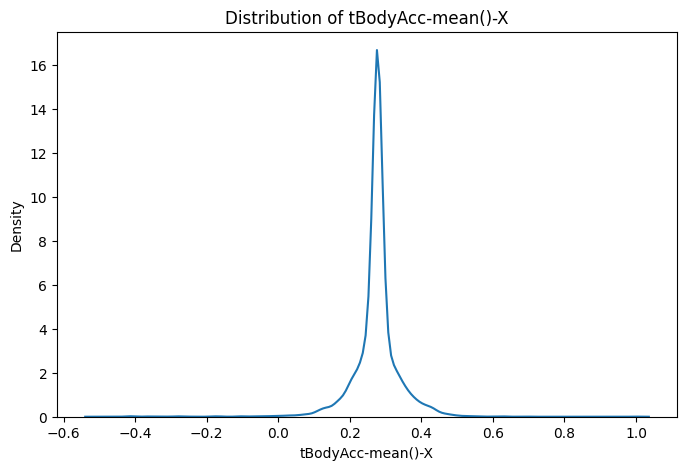

In [9]:
# kde로 tBodyAcc-mean()-X 분포 확인하기 (단변량 분석) - 예제 일뿐 다양한 방법과 다양한 변수로 단변량 그래프를 그려보세요.
plt.figure(figsize=(8, 5))
sns.kdeplot(data=data, x="tBodyAcc-mean()-X")
plt.title("Distribution of tBodyAcc-mean()-X")
plt.xlabel("tBodyAcc-mean()-X")
plt.ylabel("Density")
plt.show()

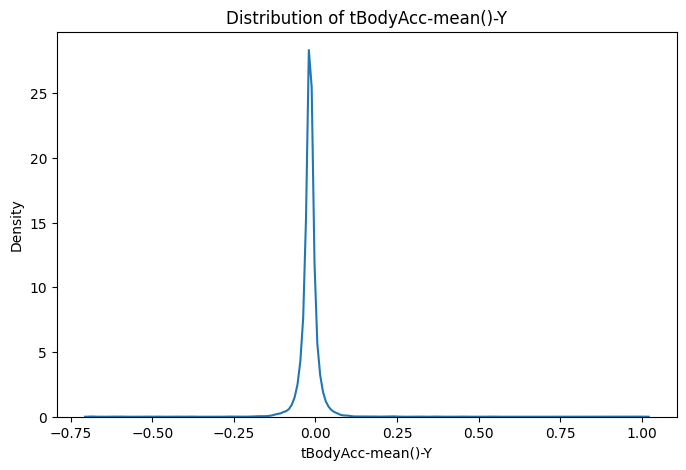

In [10]:
plt.figure(figsize=(8, 5))
sns.kdeplot(data=data, x="tBodyAcc-mean()-Y")
plt.title("Distribution of tBodyAcc-mean()-Y")
plt.xlabel("tBodyAcc-mean()-Y")
plt.ylabel("Density")
plt.show()

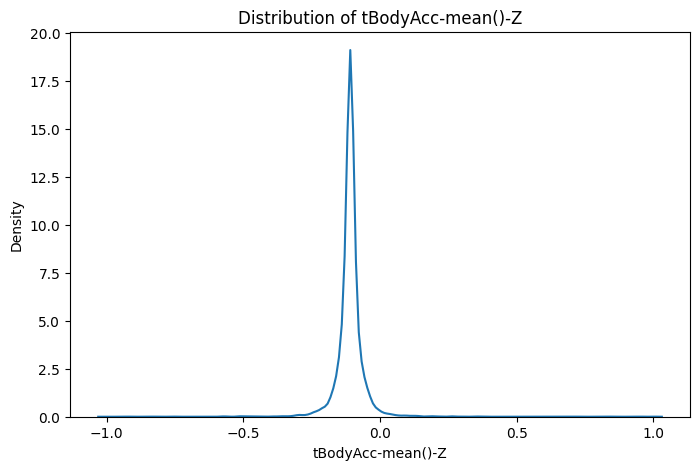

In [11]:
plt.figure(figsize=(8, 5))
sns.kdeplot(data=data, x="tBodyAcc-mean()-Z")
plt.title("Distribution of tBodyAcc-mean()-Z")
plt.xlabel("tBodyAcc-mean()-Z")
plt.ylabel("Density")
plt.show()

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\985959761.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr = data.corr()


<Axes: >

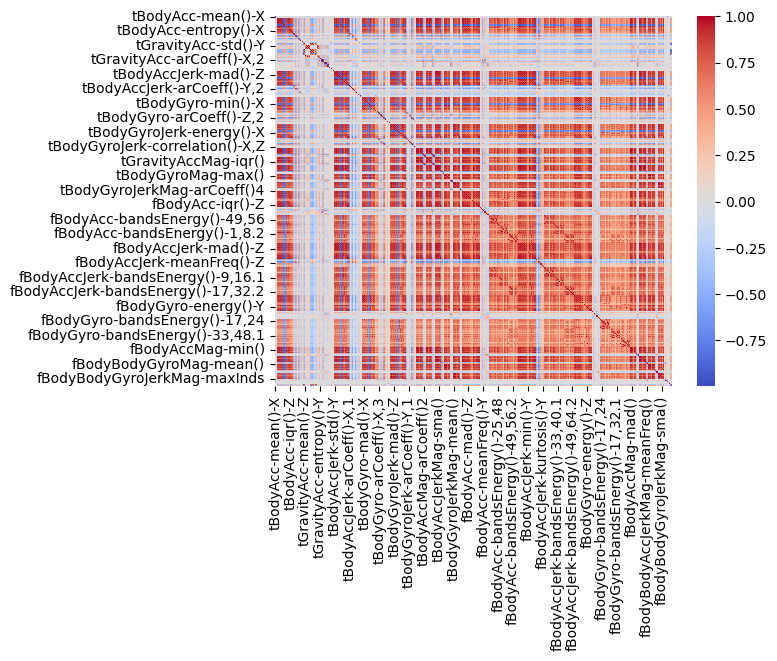

In [12]:
# 전체 데이터의 이변량 분석 (corr)
corr = data.corr()
sns.heatmap(corr, cmap='coolwarm', center=0)

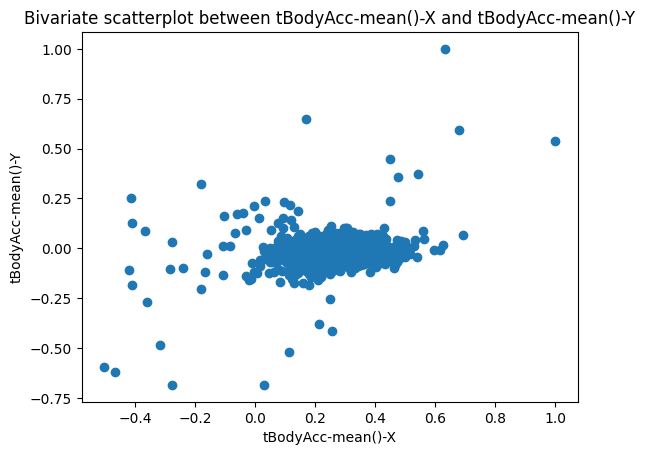

In [13]:
# 이변량 시각화 하기  (변수를 줄여서 해보는 것도 의미 있겠죠?)
plt.scatter(data['tBodyAcc-mean()-X'], data['tBodyAcc-mean()-Y'])
plt.xlabel('tBodyAcc-mean()-X')
plt.ylabel('tBodyAcc-mean()-Y')
plt.title('Bivariate scatterplot between tBodyAcc-mean()-X and tBodyAcc-mean()-Y')
plt.show()

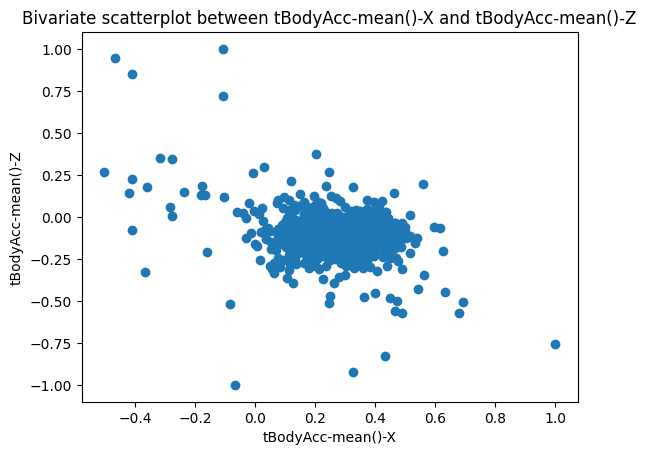

In [14]:
plt.scatter(data['tBodyAcc-mean()-X'], data['tBodyAcc-mean()-Z'])
plt.xlabel('tBodyAcc-mean()-X')
plt.ylabel('tBodyAcc-mean()-Z')
plt.title('Bivariate scatterplot between tBodyAcc-mean()-X and tBodyAcc-mean()-Z')
plt.show()

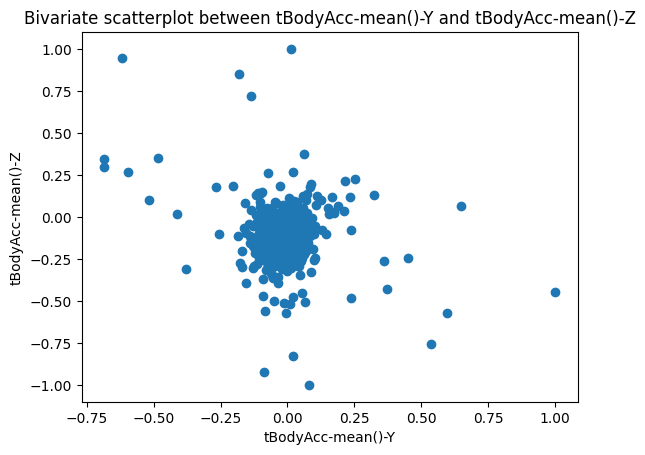

In [15]:
plt.scatter(data['tBodyAcc-mean()-Y'], data['tBodyAcc-mean()-Z'])
plt.xlabel('tBodyAcc-mean()-Y')
plt.ylabel('tBodyAcc-mean()-Z')
plt.title('Bivariate scatterplot between tBodyAcc-mean()-Y and tBodyAcc-mean()-Z')
plt.show()

### (2) 목표 변수 확인하기

* **세부 요구사항**
    - target인 'Activity'에 대해 단변량 분석을 수행합니다.
    - 범주의 종류, 범주별 빈도수 및 비율 등

In [16]:
# Calculate the frequency and ratio by category
activity_counts = data['Activity'].value_counts()
activity_ratios = data['Activity'].value_counts(normalize=True)

# Create a dataframe to display the results
activity_df = pd.DataFrame({'Counts': activity_counts, 'Ratio': activity_ratios})
activity_df.index.name = 'Activity'

print(activity_df)

                    Counts     Ratio
Activity                            
LAYING                1115  0.189594
STANDING              1087  0.184833
SITTING               1032  0.175480
WALKING                998  0.169699
WALKING_UPSTAIRS       858  0.145894
WALKING_DOWNSTAIRS     791  0.134501


In [17]:
activity_counts = data['Activity'].value_counts()

Text(0.5, 1.0, 'Distribution of Activity')

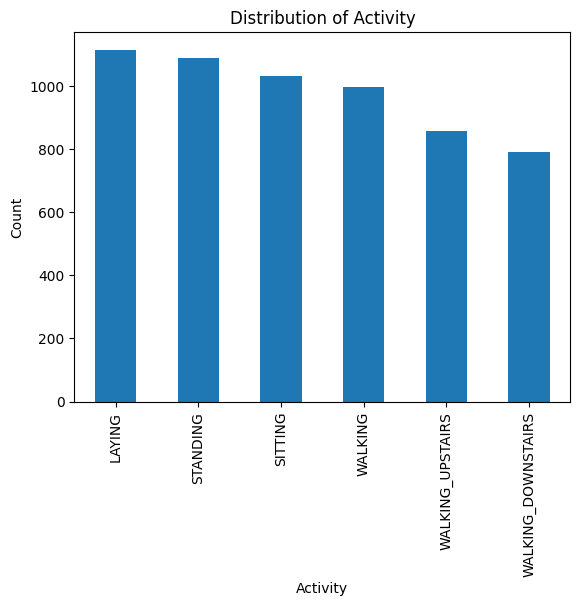

In [18]:
activity_counts.plot(kind='bar')
plt.xlabel('Activity')
plt.ylabel('Count')
plt.title('Distribution of Activity')

Text(0.5, 1.0, 'Distribution of Activity')

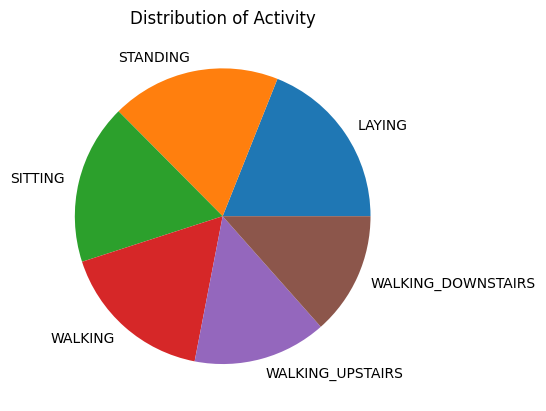

In [19]:
activity_counts.plot(kind='pie')
plt.ylabel('')  # Remove the ylabel
plt.title('Distribution of Activity')

In [20]:
activity_freq = activity_counts / len(data)
activity_ratio = activity_counts / activity_counts.sum()

Text(0.5, 1.0, 'Frequency of Activity')

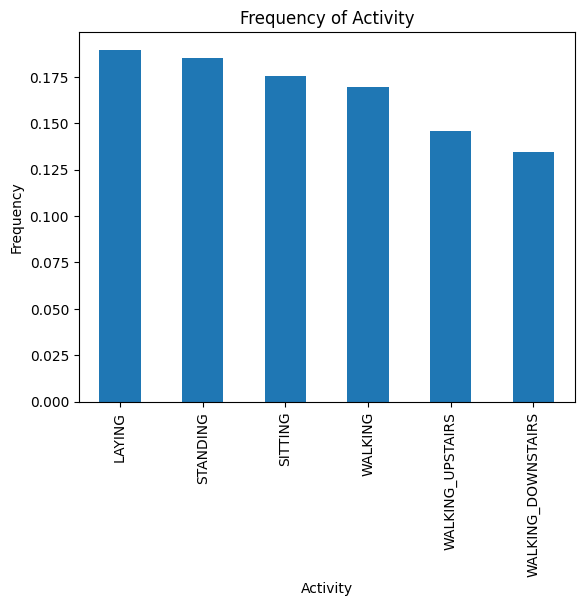

In [21]:
activity_freq.plot(kind='bar')
plt.xlabel('Activity')
plt.ylabel('Frequency')
plt.title('Frequency of Activity')

Text(0.5, 1.0, 'Ratio of Activity')

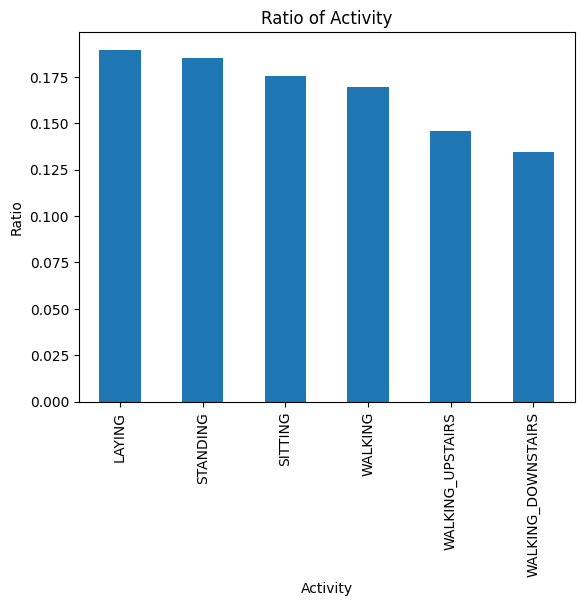

In [22]:
activity_ratio.plot(kind='bar')
plt.xlabel('Activity')
plt.ylabel('Ratio')
plt.title('Ratio of Activity')

Text(0.5, 1.0, 'Distribution of Activity')

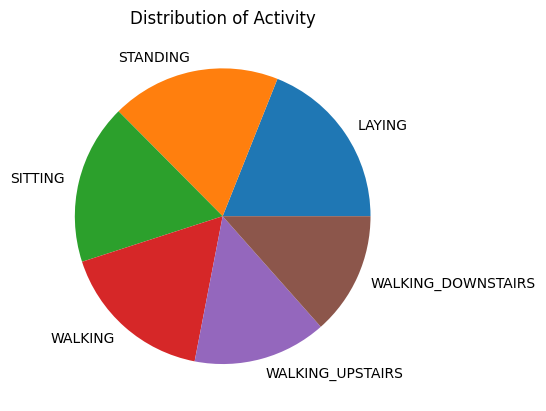

In [23]:
activity_freq.plot(kind='pie')
plt.ylabel('')  # Remove the ylabel
plt.title('Distribution of Activity')

Text(0.5, 1.0, 'Distribution of Activity')

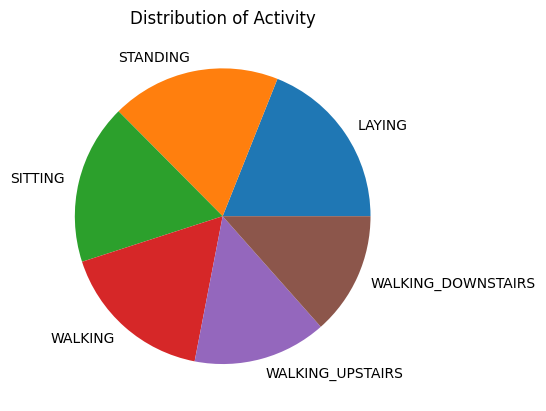

In [24]:
activity_ratio.plot(kind='pie')
plt.ylabel('')  # Remove the ylabel
plt.title('Distribution of Activity')

### (3) 센서 그룹 데이터: features

* **세부 요구사항**
    - feature 이름에 대한 계층 구조별로 변수의 수를 카운트 해 봅시다.
        - sensor 별 변수의 개수
        - agg(regation) 별 변수의 개수
        - axis 별 변수의 개수

In [25]:
#센서 그룹 데이터의 'sensor'변수의 값 확인
num_vars_per_sensor = features.groupby('sensor')['sensor'].count().sort_values(ascending=False)
print('Number of variables per sensor:')
print(num_vars_per_sensor)

Number of variables per sensor:
sensor
fBodyAccJerk            79
fBodyGyro               79
fBodyAcc                79
tBodyAccJerk            40
tGravityAcc             40
tBodyGyroJerk           40
tBodyAcc                40
tBodyGyro               40
tBodyAccMag             13
tBodyGyroMag            13
tBodyGyroJerkMag        13
tGravityAccMag          13
tBodyAccJerkMag         13
fBodyBodyGyroMag        13
fBodyBodyGyroJerkMag    13
fBodyBodyAccJerkMag     13
fBodyAccMag             13
angle                    7
Name: sensor, dtype: int64


In [26]:
#센서 그룹 데이터의 'agg'변수의 값 확인
num_vars_per_agg = features.groupby('agg')['agg'].count().sort_values(ascending=False)
print('Number of variables per agg (region):')
print(num_vars_per_agg)

Number of variables per agg (region):
agg
bandsEnergy()        126
arCoeff()             60
entropy()             33
energy()              33
min()                 33
mean()                33
max()                 33
mad()                 33
iqr()                 33
std()                 33
sma()                 17
correlation()         15
maxInds               13
meanFreq()            13
skewness()            13
kurtosis()            13
arCoeff()4             5
arCoeff()3             5
arCoeff()2             5
arCoeff()1             5
tBodyAccJerkMean       1
tBodyAccMean           1
tBodyGyroJerkMean      1
X                      1
Y                      1
Z                      1
tBodyGyroMean          1
Name: agg, dtype: int64


In [27]:
#센서 그룹 데이터의 'axis'변수의 값 확인
num_vars_per_axis = features.groupby('axis')['axis'].count().sort_values(ascending=False)
print('Number of variables per axis:')
print(num_vars_per_axis)

Number of variables per axis:
axis
Y              76
Z              76
X              76
gravityMean     6
Z,2             5
               ..
25,48.2         2
9,16.1          2
9,16.2          2
49,56.1         2
gravity         1
Name: axis, Length: 62, dtype: int64


## 3.데이터 분석 : 미션1

수많은 feature들을 모두 살펴보는 것은 과도한 시간과 노력이 필요합니다. 그래서 여러분은 **선택과 집중**을 해야 합니다.
* 1) **기본 모델을 생성**한 후 **변수 중요도**를 구합니다.   
    * random forest 알고리즘 사용을 권장합니다.
* 2) **중요한 feature와 중요하지 않은 feature 상위 N개를 선정**하고, 이들을 대상으로 EDA 수행.
* 3) **각 feature 그룹별 중요도**도 파악해보며 EDA를 수행  
    * Feature 이름에는 계층구조를 담고 있습니다. 그렇다 보니 feature들을 적절하게 그룹으로 묶을 수 있습니다.
    * 참고로, feature 그룹의 중요도는 개별 feature 중요도의 합으로 계산할 수 있습니다.

### (1) 기본모델링 + 변수중요도 추출

* **세부 요구사항**
    - 모델링을 위한 기본 전처리를 수행합니다.
        - 주어진 데이터에서는 x, y로 나누고 train과 validation 분할 수행
    - 트리기반 알고리즘을 이용하여 모델링을 합니다. 
        - 랜덤포레스트 권장 : 랜덤포레스트는 튜닝 없이 하이퍼파리미터의 기본값로도 적절한 성능의 모델을 생성할 수 있습니다.
    - 변수 중요도 추출
        - 사용자정의함수로 생성한 plot_feature_importance 을 이용
        - 변수중요도 파악및 결과 저장

#### 1) 데이터 전처리

In [28]:
# 데이터 분할을 위한 전처리
target = 'Activity'
x = data.drop(target, axis = 1)
y = data.loc[:, target]

x_train, x_val, y_train, y_val = train_test_split(x, y, test_size = .3)

#### 2) 모델링

In [29]:
#생성
model = RandomForestClassifier()

#학습
model.fit(x_train, y_train)
pred = model.predict(x_val)

#평가
print('accuracy :',accuracy_score(y_val, pred))
print('='*60)
print(confusion_matrix(y_val, pred))
print('='*60)
print(classification_report(y_val, pred))

accuracy : 0.9722379603399434
[[325   0   0   0   0   0]
 [  0 302  15   0   0   1]
 [  0  22 321   0   0   0]
 [  0   0   0 280   4   1]
 [  0   0   0   2 239   1]
 [  0   0   0   0   3 249]]
                    precision    recall  f1-score   support

            LAYING       1.00      1.00      1.00       325
           SITTING       0.93      0.95      0.94       318
          STANDING       0.96      0.94      0.95       343
           WALKING       0.99      0.98      0.99       285
WALKING_DOWNSTAIRS       0.97      0.99      0.98       242
  WALKING_UPSTAIRS       0.99      0.99      0.99       252

          accuracy                           0.97      1765
         macro avg       0.97      0.97      0.97      1765
      weighted avg       0.97      0.97      0.97      1765



#### 3) 변수 중요도 추출

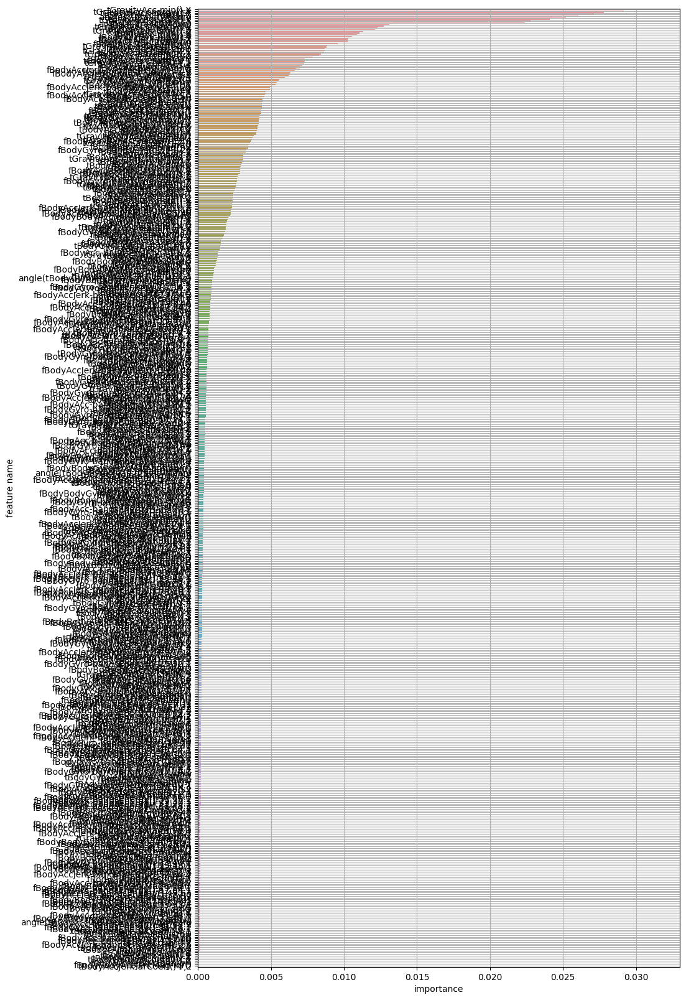

In [30]:
# 변수 중요도 추출
importance = model.feature_importances_

# Get the names of the features
names = x_train.columns

# Plot the feature importance using the plot_feature_importance function
fi_df = plot_feature_importance(importance, names)

In [31]:
fi_df.sort_values(by=['feature_importance'],ascending=False)
fi_df.head()

,feature_name,feature_importance
0,tGravityAcc-min()-X,0.031428
1,tGravityAcc-energy()-X,0.029141
2,tGravityAcc-mean()-Y,0.027794
3,tGravityAcc-max()-X,0.027099
4,"angle(Y,gravityMean)",0.026070


In [32]:
# Save the feature importance to a CSV file
fi_df.to_csv('feature_importance.csv', index=False)

#### 4) feature importance 데이터 가져오기
위 모델링을 통해 생성한 feature별 중요도 데이터를 제공해 드립니다. random forest 모델링이 너무 어렵다면, 해당 데이터를 활용해도 무방합니다.

In [33]:
#fi_analysis 데이터 불러오기
data_path = "./fi_analysis.csv"
fi_analysis = pd.read_csv(data_path)
r0 = fi_analysis.filter(items=['feature_name','fi_all'])
r0.rename(columns={'fi_all':'feature_importance'}, inplace=True) 
r0.sort_values(by=['feature_importance'], axis=0, ascending=False)

,feature_name,feature_importance
49,tGravityAcc-max()-X,0.032798
559,"angle(Y,gravityMean)",0.030676
56,tGravityAcc-energy()-X,0.030037
52,tGravityAcc-min()-X,0.025349
558,"angle(X,gravityMean)",0.024910
...,...,...
341,"fBodyAcc-bandsEnergy()-49,64.2",0.000093
392,"fBodyAccJerk-bandsEnergy()-49,64",0.000092
319,"fBodyAcc-bandsEnergy()-25,32.1",0.000087
548,fBodyBodyGyroJerkMag-iqr(),0.000079


### (2) 중요도 기반 feature 분석

* **세부 요구사항**
    - 상위 n, 하위 m 개의 변수를 선정
    - 선정된 변수(feature)와 target 간의 관계를 kdeplot으로 그리기

In [34]:
r0=r0.sort_values(by=['feature_importance'], axis=0, ascending=True)
bottom_5=r0[:5]
bottom_5

,feature_name,feature_importance
523,fBodyBodyAccJerkMag-entropy(),0.000078
548,fBodyBodyGyroJerkMag-iqr(),0.000079
319,"fBodyAcc-bandsEnergy()-25,32.1",0.000087
392,"fBodyAccJerk-bandsEnergy()-49,64",0.000092
341,"fBodyAcc-bandsEnergy()-49,64.2",0.000093


In [35]:
r0=r0.sort_values(by=['feature_importance'], axis=0, ascending=False)
top_5 = r0[:5]
top_5

,feature_name,feature_importance
49,tGravityAcc-max()-X,0.032798
559,"angle(Y,gravityMean)",0.030676
56,tGravityAcc-energy()-X,0.030037
52,tGravityAcc-min()-X,0.025349
558,"angle(X,gravityMean)",0.024910


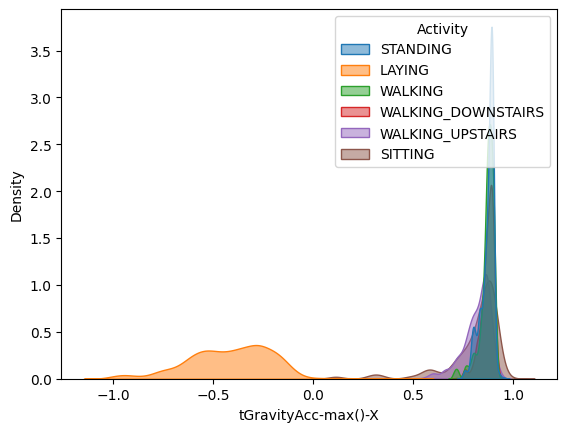

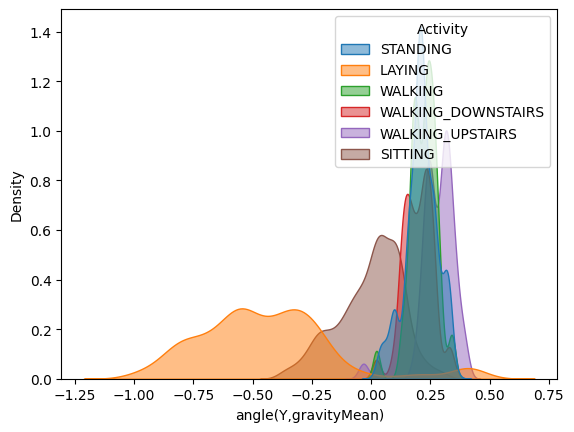

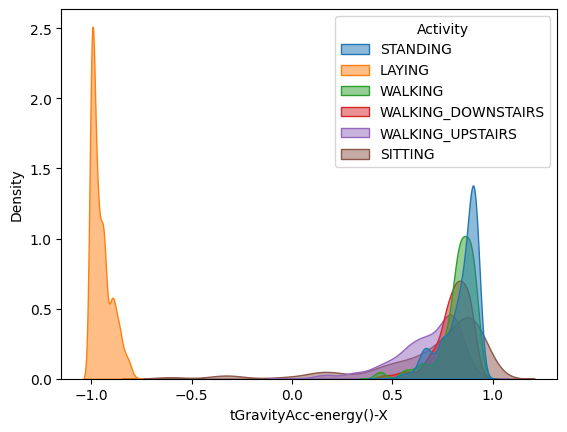

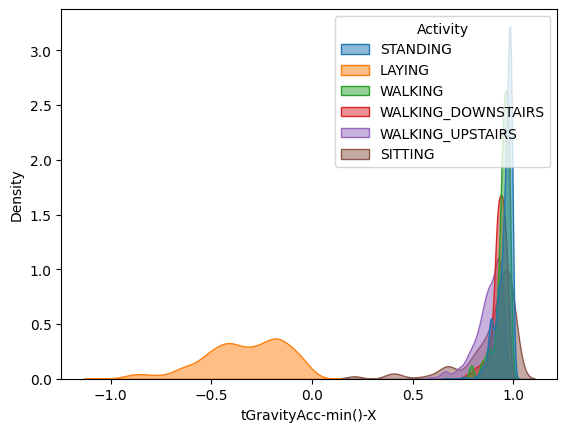

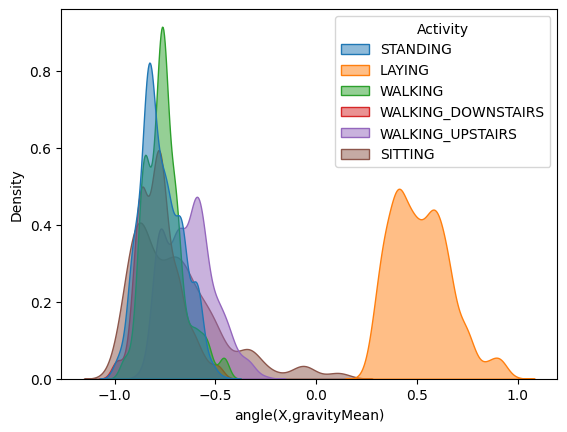

In [36]:
# 각 feature와 target 간의 관계를 그리기 위한 데이터프레임 생성
plot_df = data[['Activity'] + top_5['feature_name'].to_list()]

# 각 feature와 target 간의 kdeplot 그리기
for feature_name in top_5['feature_name']:
    sns.kdeplot(data=plot_df, x=feature_name, hue='Activity', fill=True, alpha=.5)
    plt.show()

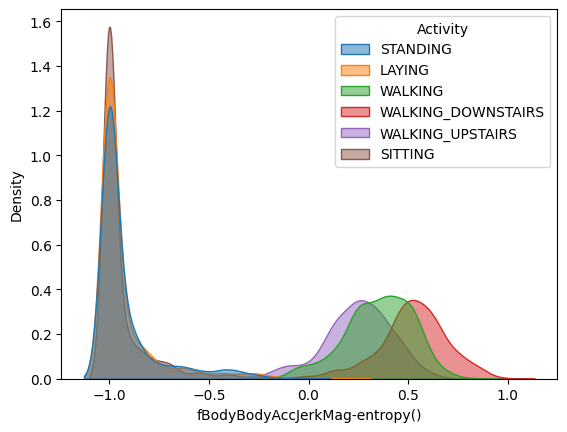

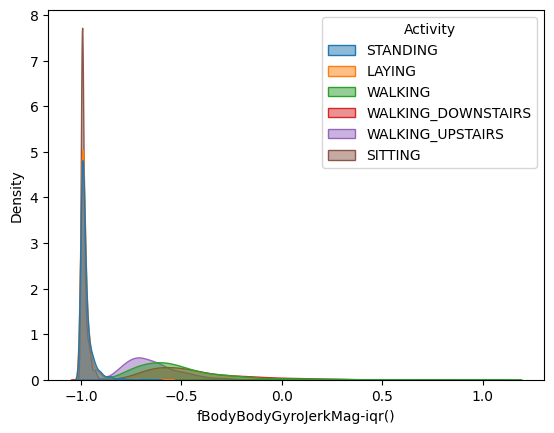

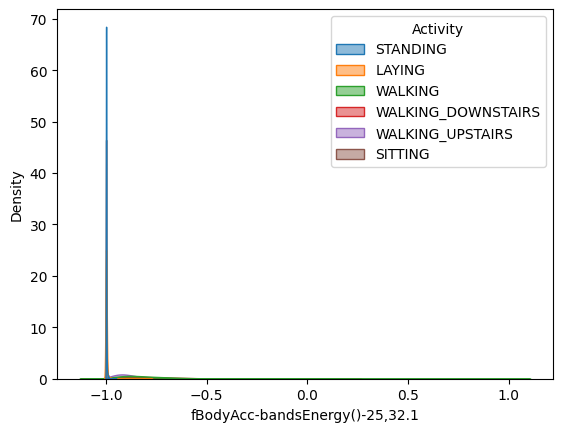

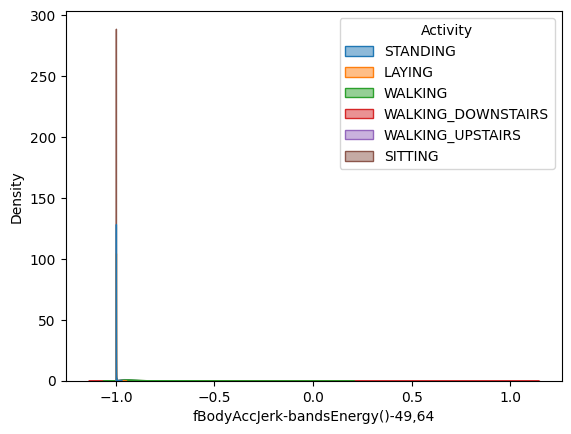

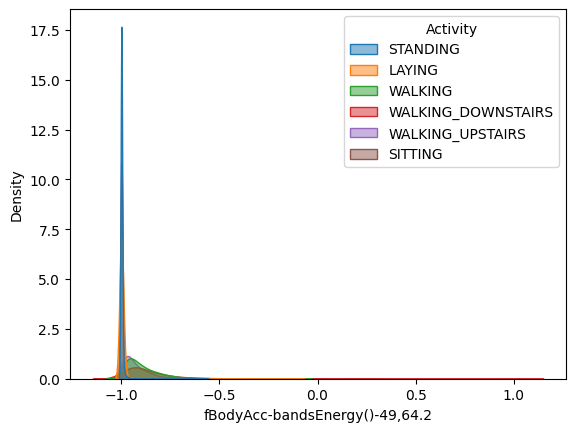

In [37]:
# 각 feature와 target 간의 관계를 그리기 위한 데이터프레임 생성
plot_df = data[['Activity'] + bottom_5['feature_name'].to_list()]

# 각 feature와 target 간의 kdeplot 그리기
for feature_name in bottom_5['feature_name']:
    sns.kdeplot(data=plot_df, x=feature_name, hue='Activity', fill=True, alpha=.5)
    plt.show()

### (3) feature 그룹별 분석

* **세부 요구사항**
    - 제공된 features.csv 에는 feature에 대한 계층구조를 정리해 놓았습니다.
    - features와 변수중요도 결과를 merge 하시오.
    - sensor 별 중요도 합계를 구하고 상위 변수 그룹별 비교 분석을 수행 하시오.
    - sensor + agg 별 중요도 합계를 구하고 상위 변수 그룹별 비교 분석을 수행 하시오. 


#### 1) 결과 merge

In [38]:
merged_df = pd.merge(r0, features, on='feature_name')
merged_df

,feature_name,feature_importance,sensor,agg,axis
0,tGravityAcc-max()-X,0.032798,tGravityAcc,max(),X
1,"angle(Y,gravityMean)",0.030676,angle,Y,gravityMean
2,tGravityAcc-energy()-X,0.030037,tGravityAcc,energy(),X
3,tGravityAcc-min()-X,0.025349,tGravityAcc,min(),X
4,"angle(X,gravityMean)",0.024910,angle,X,gravityMean
...,...,...,...,...,...
640,"fBodyAcc-bandsEnergy()-49,64.2",0.000093,fBodyAcc,bandsEnergy(),"49,64.2"
641,"fBodyAccJerk-bandsEnergy()-49,64",0.000092,fBodyAccJerk,bandsEnergy(),"49,64"
642,"fBodyAcc-bandsEnergy()-25,32.1",0.000087,fBodyAcc,bandsEnergy(),"25,32.1"
643,fBodyBodyGyroJerkMag-iqr(),0.000079,fBodyBodyGyroJerkMag,iqr(),NaN


#### 2) sensor 별 중요도

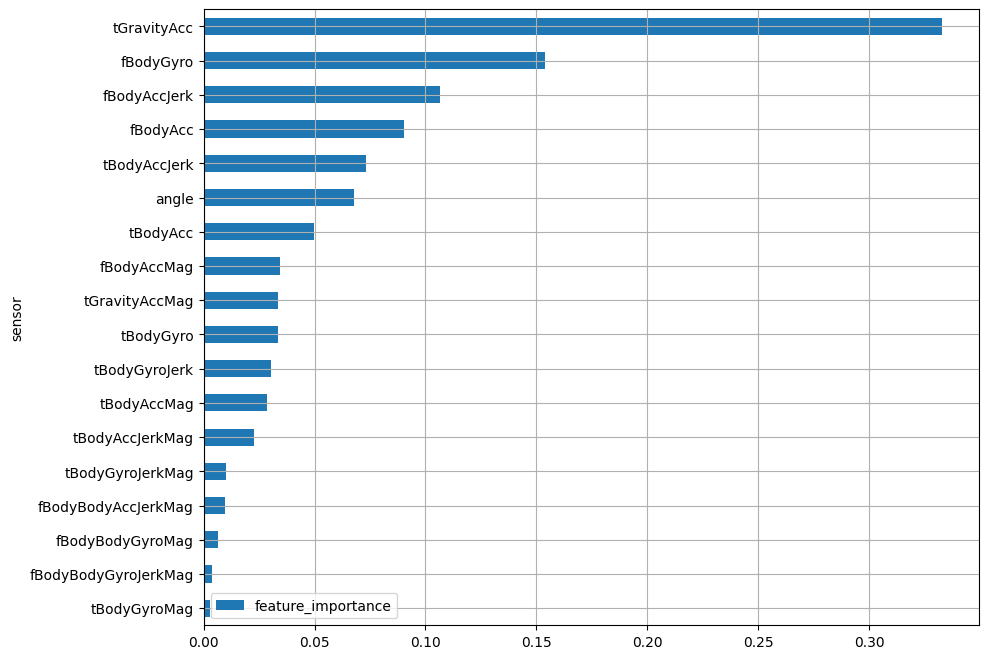

In [39]:
sensor_sum = merged_df.groupby('sensor')['feature_importance'].sum().reset_index().sort_values('feature_importance', ascending=True)
sensor_sum.plot.barh(x='sensor', y='feature_importance', figsize=(10,8))
plt.grid()
plt.show()

#### 3) sensor + agg 별 중요도

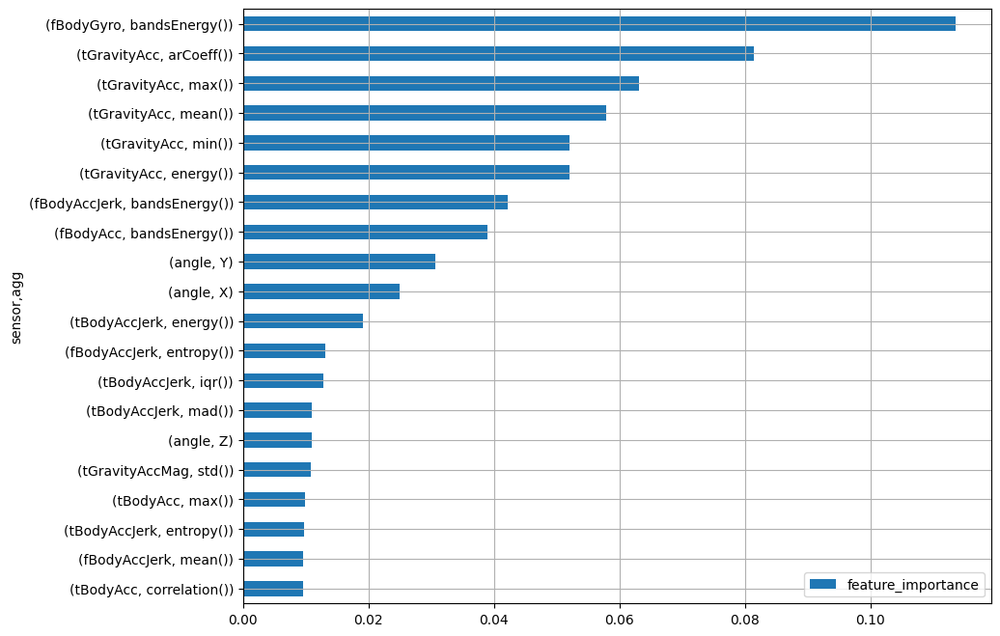

In [40]:
temp=merged_df.groupby(['sensor','agg'])[['feature_importance']].sum().sort_values('feature_importance')
temp.tail(20).plot.barh(figsize=(10,8))
plt.grid()
plt.show()

#### 3-1) sensor 별, agg로 나눠서 분석하기


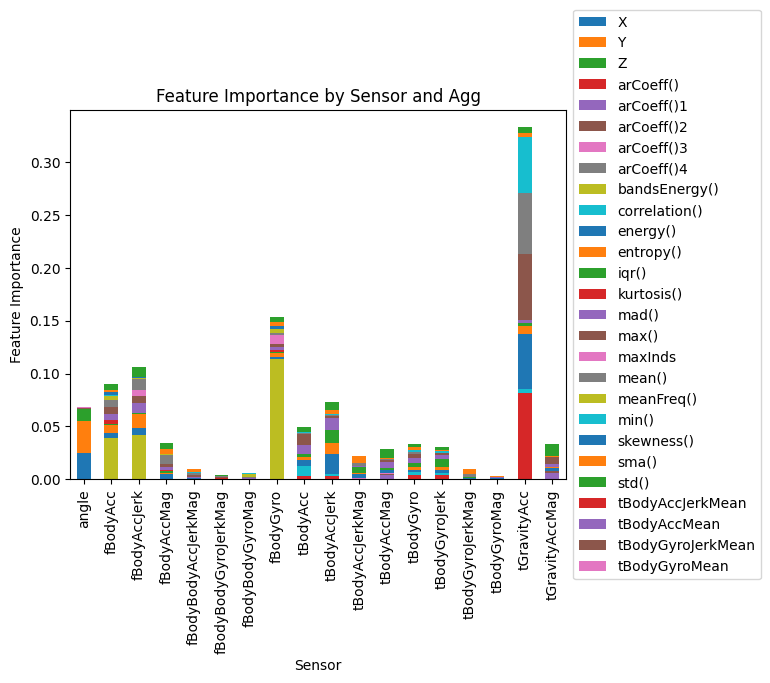

In [41]:
# Perform the analysis for sensor and agg
sensor_agg_analysis = merged_df.groupby(['sensor', 'agg'])['feature_importance'].sum().unstack()

# Visualize the results
ax = sensor_agg_analysis.plot(kind='bar', stacked=True)
plt.xlabel('Sensor')
plt.ylabel('Feature Importance')
plt.title('Feature Importance by Sensor and Agg')

# Adjust legend position
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()


## 4.데이터 분석 : 미션2

다음의 case에 맞게 feature 및 feature 그룹 중요도를 기반으로 탐색적 데이터 분석을 수행하시오.
* 1) Target을 **정적/동적 행동**으로 구분
    * 6개의 행동은 2개의 그룹(정적행동, 동적행동)으로 나뉩니다.  
    * 어떤 feature(혹은 feature 그룹)이 2개 class 그룹(정적행동, 동적행동)를 구분하는데 중요한지를 찾아보고 탐색해봅시다. 
* 2) Target을 **개별 행동 여부**로 구분
    * 6가지의 행동을 분류하는 분석도 중요하지만, 개별 행동에만 특별히 영향을 받는 feature들도 있습니다. 
    * 예를 들어, 계단을 오르는 행동(Walking_upstairs)과 관련이 큰 feature가 있을 것입니다. [계단을 오르는 행동]인지 아닌지로 구분하는 targe을 추가하여 EDA를 수행해 봅시다.

### (1) 정적/동적 행동으로 구분하여 분석하기

* **세부 요구사항**
    - Target인 Activity를 is_dynamic 변수로 변경하시오.
        * 값 0 : STANDING, SITTING, LAYING
        * 값 1 : WALKING, WALKING_UPSTAIRS, WALKING_DOWNSTAIRS
    - is_dynamic을 예측하기 위한 기본 모델을 생성하시오.
        * x, is_dynamic을 이용하여 train과 validation으로 데이터 분할
        * 기본 모델링
    - is_dynamic 을 구분하는데 중요한 변수 상위 5를 분석하시오.
    - is_dynamic 을 구분하는데 중요한 변수 그룹을 분석하시오.
        * sensor별
        * sensor+agg 별


#### 1) is_dynamic 추가 (옵션)

In [42]:
is_dynamic = y.map({'STANDING':0, 'SITTING':0, 'LAYING':0, 
                  'WALKING':1, 'WALKING_UPSTAIRS':1, 'WALKING_DOWNSTAIRS':1})
is_dynamic

0       0
1       0
2       0
3       1
4       1
       ..
5876    0
5877    1
5878    0
5879    1
5880    0
Name: Activity, Length: 5881, dtype: int64

#### 2) 기본모델 생성 (옵션)

In [43]:
x_train, x_val, y_train, y_val = train_test_split(x, is_dynamic, test_size = .3)

In [44]:
model = RandomForestClassifier()
model.fit(x_train, y_train)
pred = model.predict(x_val)

print('accuracy :',accuracy_score(y_val, pred))
print('='*60)
print(confusion_matrix(y_val, pred))
print('='*60)
print(classification_report(y_val, pred))

accuracy : 0.9994334277620397
[[936   1]
 [  0 828]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       937
           1       1.00      1.00      1.00       828

    accuracy                           1.00      1765
   macro avg       1.00      1.00      1.00      1765
weighted avg       1.00      1.00      1.00      1765



#### 3) 변수중요도 상위 5개 분석 (옵션)

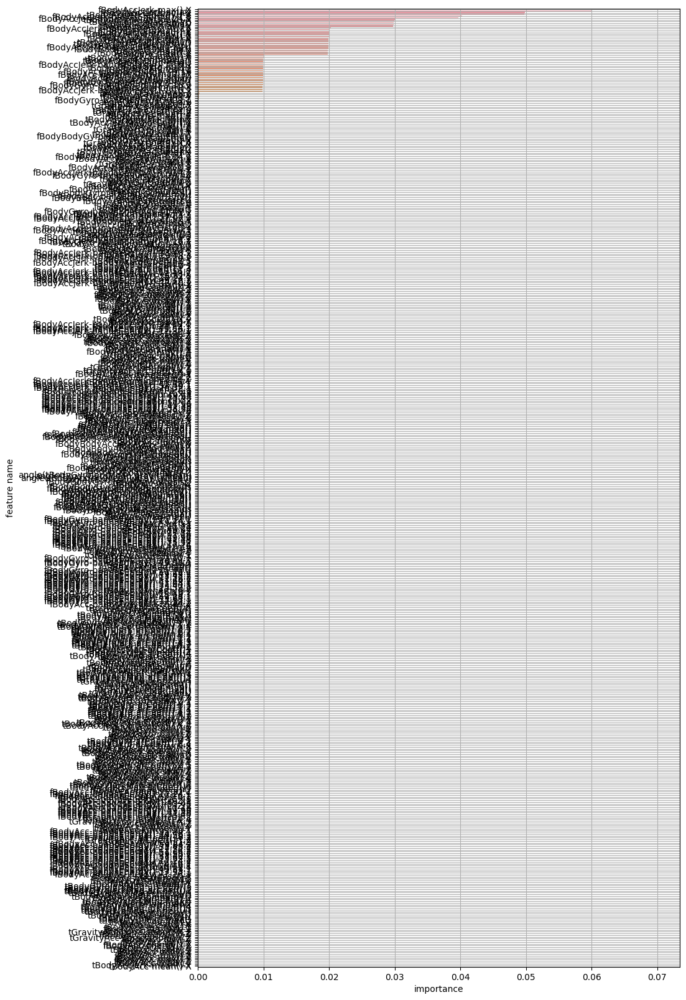

In [45]:
# 변수 중요도 추출
#importance = model.feature_importances_

# Get the names of the features
#names = x_train.columns

# Plot the feature importance using the plot_feature_importance function
dynamic = plot_feature_importance(model.feature_importances_, list(x_train), False)

In [46]:
dynamic.sort_values(by=['feature_importance'],ascending=False)
dynamic.head()

,feature_name,feature_importance
0,fBodyAccJerk-max()-X,0.069951
1,tBodyAccJerk-sma(),0.060038
2,fBodyAcc-entropy()-X,0.049852
3,tBodyAccJerk-energy()-X,0.049759
4,"fBodyAccJerk-bandsEnergy()-1,8",0.040270


C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2455594396.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


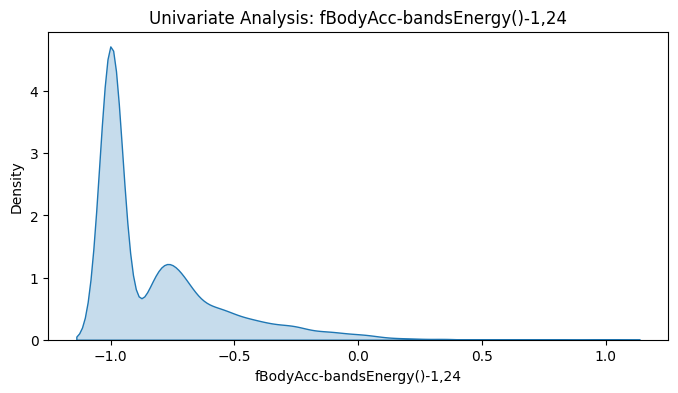

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2455594396.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


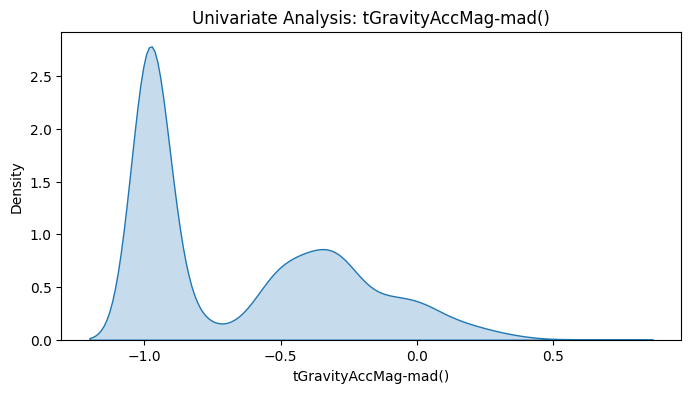

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2455594396.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


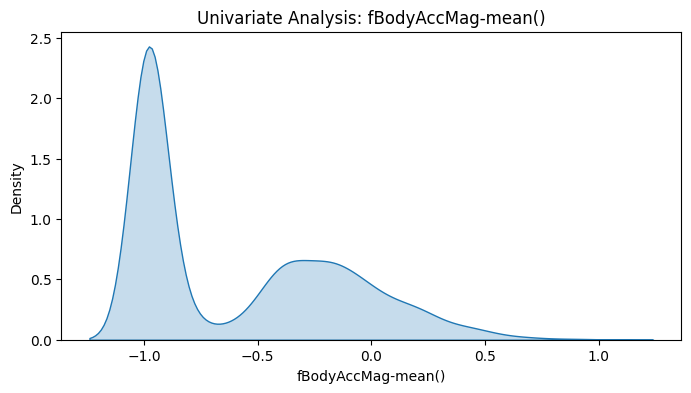

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2455594396.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


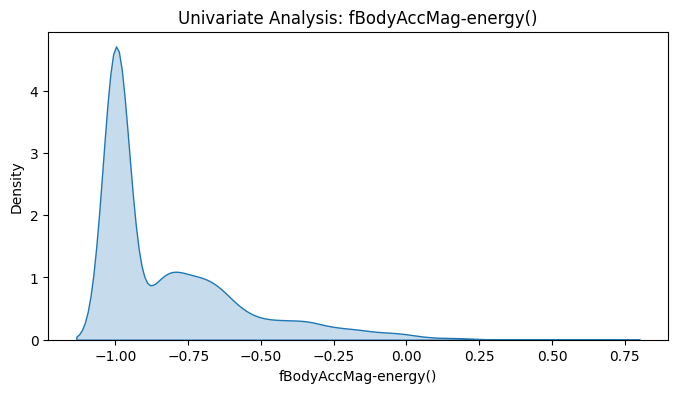

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2455594396.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


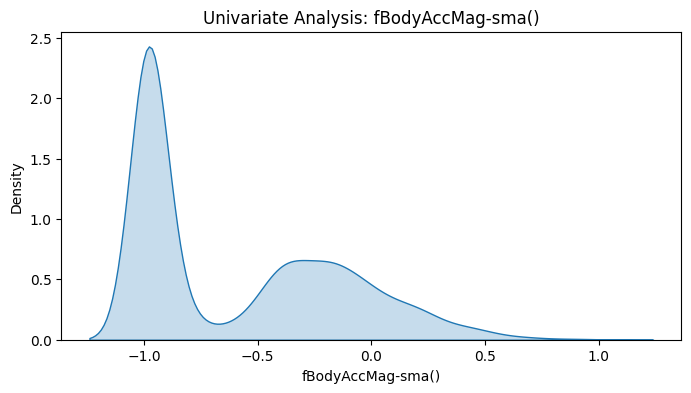

In [47]:
top_5_variables = ['fBodyAcc-bandsEnergy()-1,24', 'tGravityAccMag-mad()', 'fBodyAccMag-mean()',
                   'fBodyAccMag-energy()', 'fBodyAccMag-sma()']

for variable in top_5_variables:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data[variable], shade=True)
    plt.title(f'Univariate Analysis: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()


#### 데이터 가져오기로 1), 2) 대체 가능

In [48]:
#fi_analysis 데이터 불러오기
#data_path = "./fi_analysis.csv"
#fi_analysis = pd.read_csv(data_path)
#r_dyn = fi_analysis.filter(items=['feature_name','fi_all'])
#r_dyn.rename(columns={'fi_dynamic':'feature_importance'}, inplace=True) 
#r_dyn.sort_values(by=['feature_importance'], axis=0, ascending=False)

#### 4) feature 그룹별 분석

In [49]:
merged_df = pd.merge(dynamic, features, on='feature_name')
merged_df

,feature_name,feature_importance,sensor,agg,axis
0,fBodyAccJerk-max()-X,0.069951,fBodyAccJerk,max(),X
1,tBodyAccJerk-sma(),0.060038,tBodyAccJerk,sma(),NaN
2,fBodyAcc-entropy()-X,0.049852,fBodyAcc,entropy(),X
3,tBodyAccJerk-energy()-X,0.049759,tBodyAccJerk,energy(),X
4,"fBodyAccJerk-bandsEnergy()-1,8",0.040270,fBodyAccJerk,bandsEnergy(),"1,8"
...,...,...,...,...,...
556,fBodyAcc-max()-X,0.000000,fBodyAcc,max(),X
557,fBodyAcc-mad()-Z,0.000000,fBodyAcc,mad(),Z
558,fBodyAcc-mad()-Y,0.000000,fBodyAcc,mad(),Y
559,tBodyAccJerk-mean()-X,0.000000,tBodyAccJerk,mean(),X


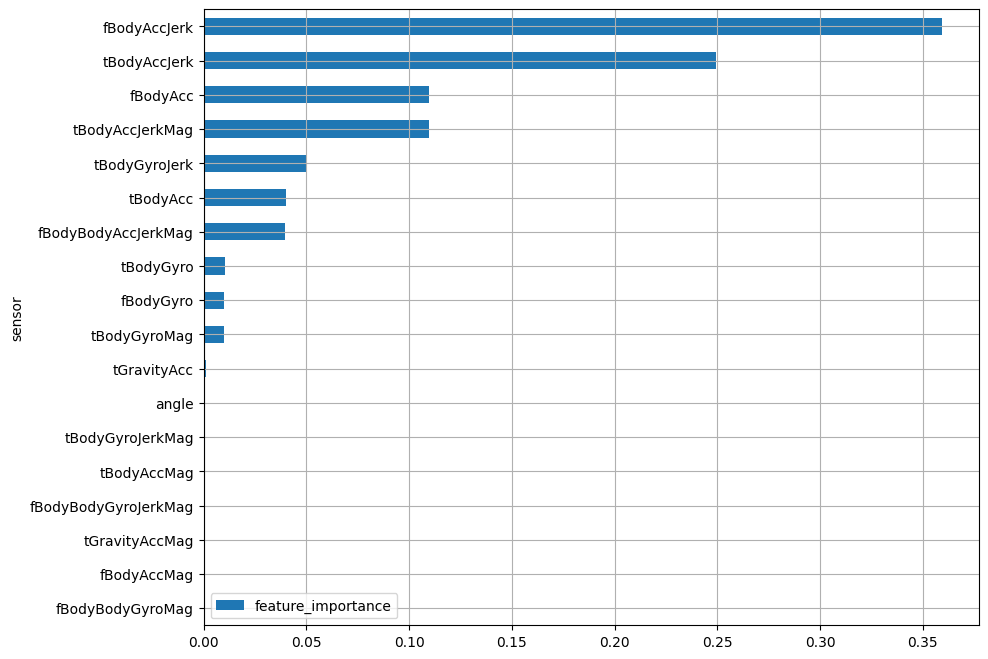

In [50]:
sensor_sum = merged_df.groupby('sensor')['feature_importance'].sum().reset_index().sort_values('feature_importance', ascending=True)
sensor_sum.plot.barh(x='sensor', y='feature_importance', figsize=(10,8))
plt.grid()
plt.show()

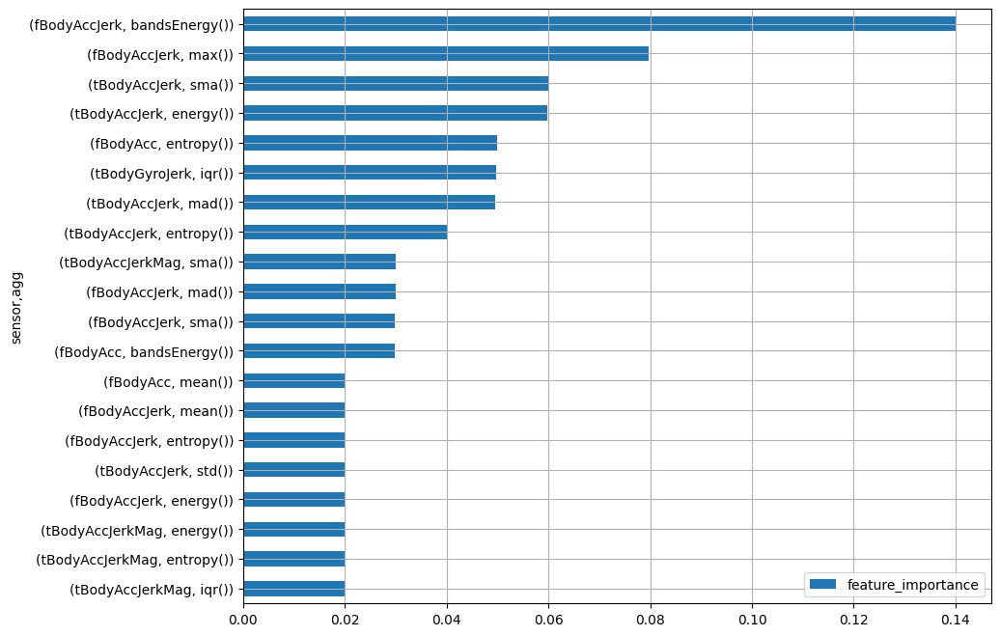

In [51]:
temp=merged_df.groupby(['sensor','agg'])[['feature_importance']].sum().sort_values('feature_importance')
temp.tail(20).plot.barh(figsize=(10,8))
plt.grid()
plt.show()

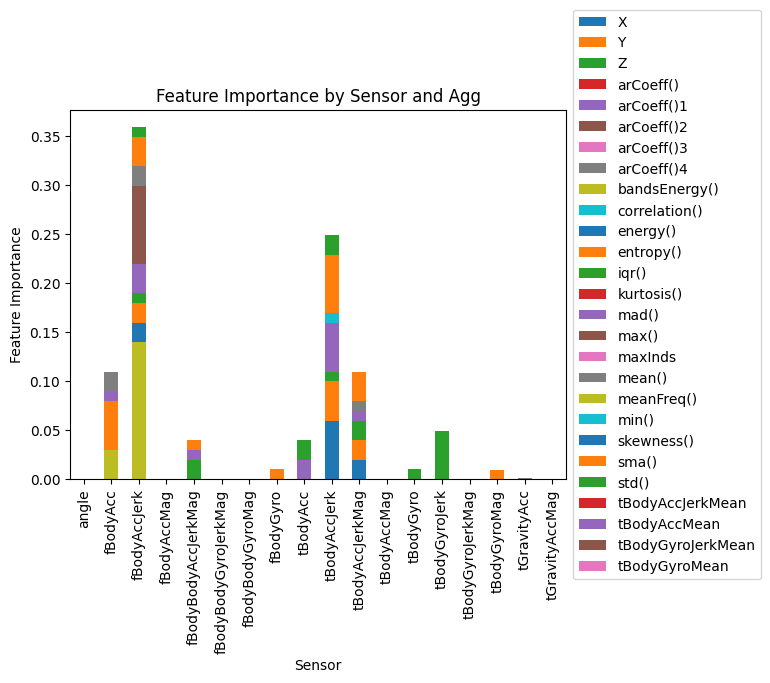

In [52]:
# Perform the analysis for sensor and agg
sensor_agg_analysis = merged_df.groupby(['sensor', 'agg'])['feature_importance'].sum().unstack()

# Visualize the results
ax = sensor_agg_analysis.plot(kind='bar', stacked=True)
plt.xlabel('Sensor')
plt.ylabel('Feature Importance')
plt.title('Feature Importance by Sensor and Agg')

# Adjust legend position
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

### (2) 개별 동작 분석 : is_standing


* **세부 요구사항**
    - Target인 Activity를 is_standing 변수로 변경하시오.
        * 값 1 : STANDING
        * 값 0 : 나머지
    - is_standing 을 예측하기 위한 기본 모델을 생성하시오.
        * x, is_standing 을 이용하여 train과 validation으로 데이터 분할
        * 기본 모델링
    - is_standing 을 구분하는데 중요한 변수 상위 5를 분석하시오.
    - is_standing 을 구분하는데 중요한 변수 그룹을 분석하시오.
        * sensor별
        * sensor+agg 별


In [53]:
is_standing = y.map({'STANDING':1, 'SITTING':0, 'LAYING':0, 
                  'WALKING':0, 'WALKING_UPSTAIRS':0, 'WALKING_DOWNSTAIRS':0})
is_standing

0       1
1       0
2       1
3       0
4       0
       ..
5876    0
5877    0
5878    0
5879    0
5880    0
Name: Activity, Length: 5881, dtype: int64

In [54]:
x_train, x_val, y_train, y_val = train_test_split(x, is_standing, test_size = .3)

In [55]:
model = RandomForestClassifier()
model.fit(x_train, y_train)
pred = model.predict(x_val)

print('accuracy :',accuracy_score(y_val, pred))
print('='*60)
print(confusion_matrix(y_val, pred))
print('='*60)
print(classification_report(y_val, pred))

accuracy : 0.9864022662889519
[[1444    9]
 [  15  297]]
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1453
           1       0.97      0.95      0.96       312

    accuracy                           0.99      1765
   macro avg       0.98      0.97      0.98      1765
weighted avg       0.99      0.99      0.99      1765



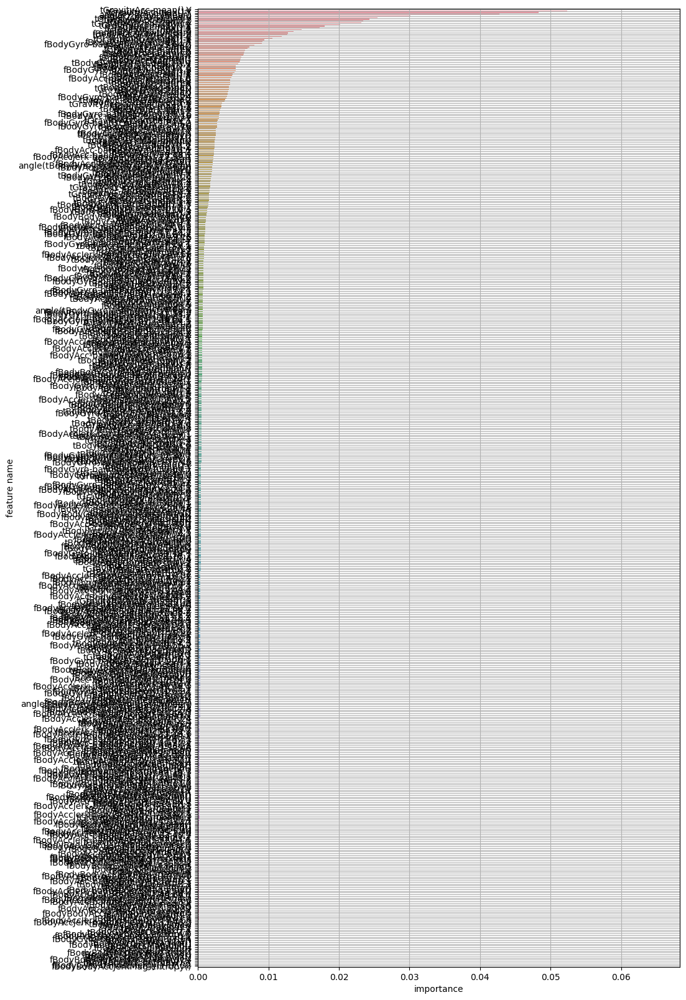

In [56]:
# 변수 중요도 추출
#importance = model.feature_importances_

# Get the names of the features
#names = x_train.columns

# Plot the feature importance using the plot_feature_importance function
standing = plot_feature_importance(model.feature_importances_, list(x_train), False)

In [57]:
standing.sort_values(by=['feature_importance'],ascending=False)
standing.head()

,feature_name,feature_importance
0,tGravityAcc-mean()-Y,0.065090
1,tGravityAcc-max()-Y,0.052370
2,tGravityAcc-min()-Y,0.048331
3,"angle(Y,gravityMean)",0.042727
4,"angle(Z,gravityMean)",0.030141


C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1509614092.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


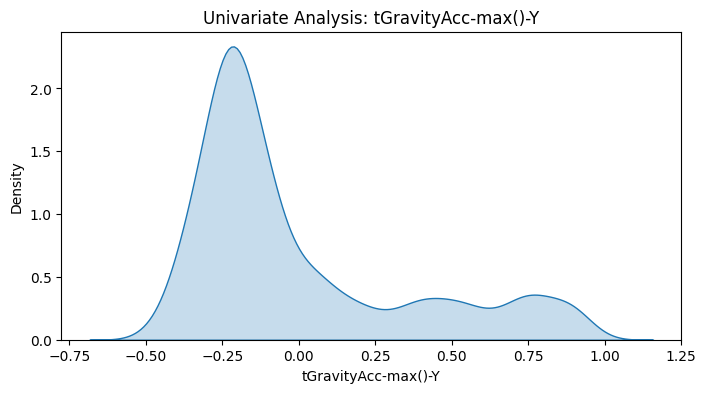

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1509614092.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


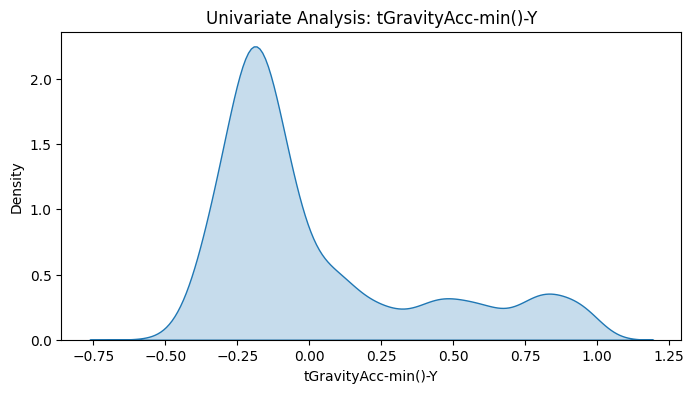

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1509614092.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


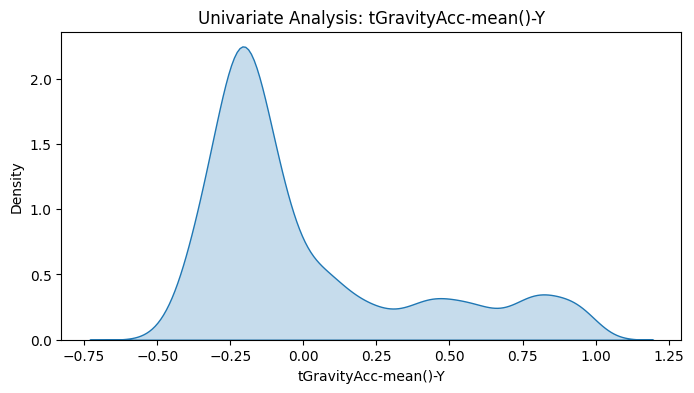

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1509614092.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


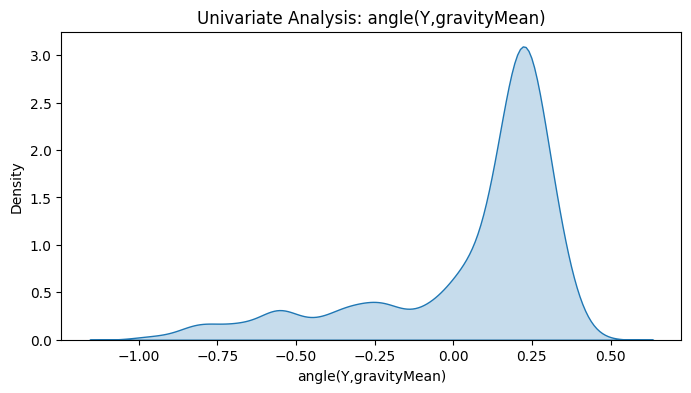

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1509614092.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


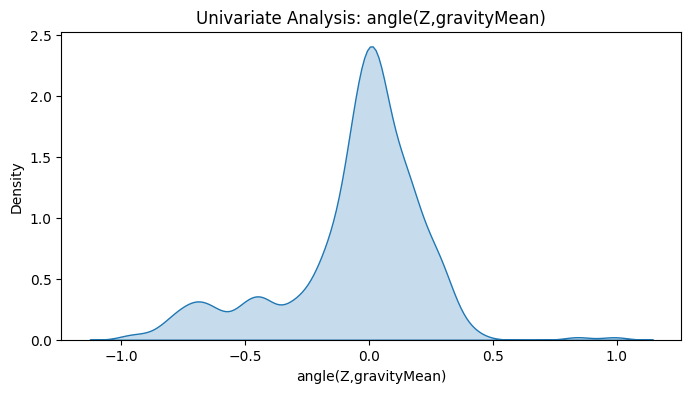

In [58]:
top_5_variables = ['tGravityAcc-max()-Y', 'tGravityAcc-min()-Y', 'tGravityAcc-mean()-Y',
                   'angle(Y,gravityMean)', 'angle(Z,gravityMean)']

for variable in top_5_variables:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data[variable], shade=True)
    plt.title(f'Univariate Analysis: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

In [59]:
merged_df = pd.merge(standing, features, on='feature_name')
merged_df

,feature_name,feature_importance,sensor,agg,axis
0,tGravityAcc-mean()-Y,0.065090,tGravityAcc,mean(),Y
1,tGravityAcc-max()-Y,0.052370,tGravityAcc,max(),Y
2,tGravityAcc-min()-Y,0.048331,tGravityAcc,min(),Y
3,"angle(Y,gravityMean)",0.042727,angle,Y,gravityMean
4,"angle(Z,gravityMean)",0.030141,angle,Z,gravityMean
...,...,...,...,...,...
556,fBodyAccJerk-entropy()-Z,0.000031,fBodyAccJerk,entropy(),Z
557,"fBodyGyro-bandsEnergy()-17,32",0.000021,fBodyGyro,bandsEnergy(),"17,32"
558,"fBodyGyro-bandsEnergy()-17,32",0.000021,fBodyGyro,bandsEnergy(),"17,32"
559,"fBodyGyro-bandsEnergy()-17,32",0.000021,fBodyGyro,bandsEnergy(),"17,32"


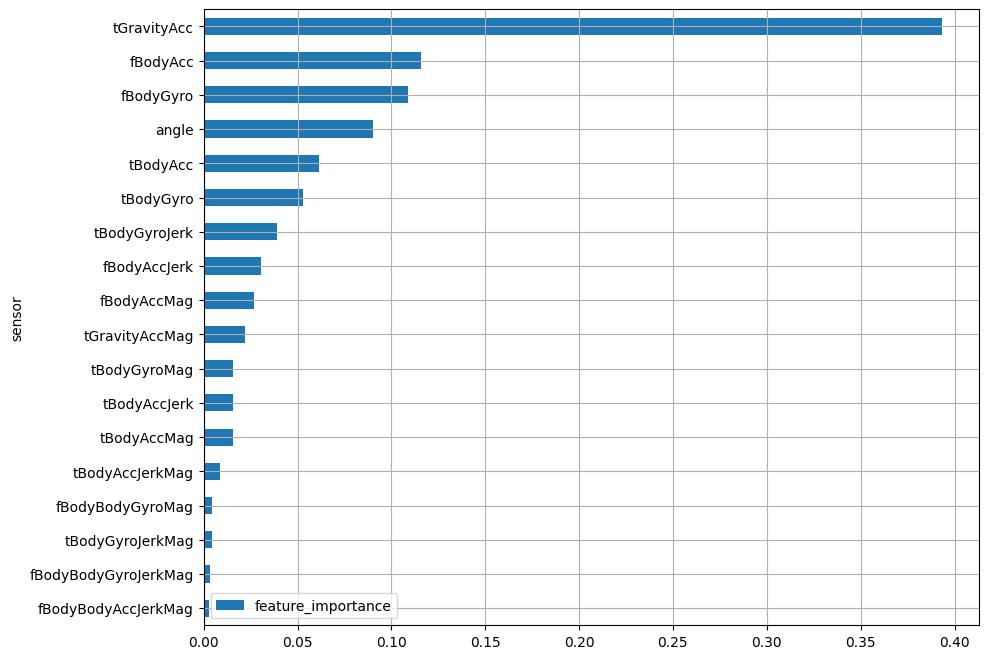

In [60]:
sensor_sum = merged_df.groupby('sensor')['feature_importance'].sum().reset_index().sort_values('feature_importance', ascending=True)
sensor_sum.plot.barh(x='sensor', y='feature_importance', figsize=(10,8))
plt.grid()
plt.show()

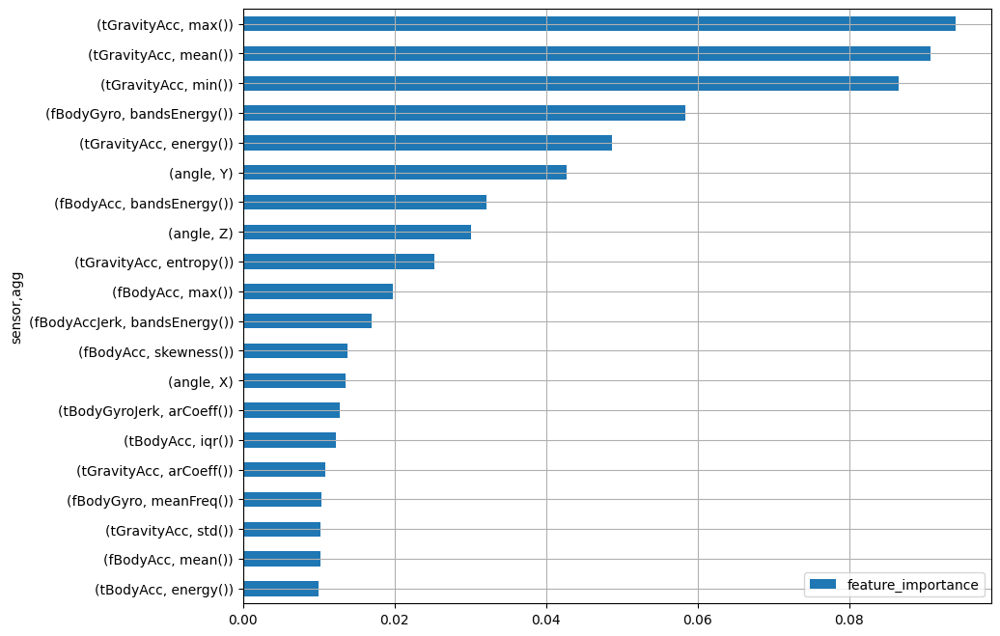

In [61]:
temp=merged_df.groupby(['sensor','agg'])[['feature_importance']].sum().sort_values('feature_importance')
temp.tail(20).plot.barh(figsize=(10,8))
plt.grid()
plt.show()

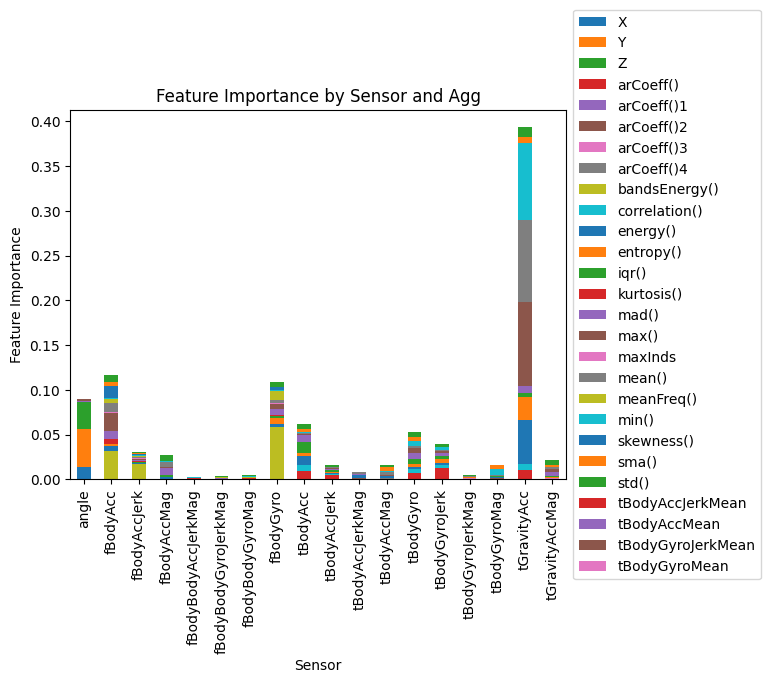

In [62]:
# Perform the analysis for sensor and agg
sensor_agg_analysis = merged_df.groupby(['sensor', 'agg'])['feature_importance'].sum().unstack()

# Visualize the results
ax = sensor_agg_analysis.plot(kind='bar', stacked=True)
plt.xlabel('Sensor')
plt.ylabel('Feature Importance')
plt.title('Feature Importance by Sensor and Agg')

# Adjust legend position
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

### (3) 개별 동작 분석 : is_sitting


* **세부 요구사항**
    - Target인 Activity를 is_sitting 변수로 변경하시오.
        * 값 1 : SITTING
        * 값 0 : 나머지
    - is_sitting 을 예측하기 위한 기본 모델을 생성하시오.
        * x, is_sitting 을 이용하여 train과 validation으로 데이터 분할
        * 기본 모델링
    - is_sitting 을 구분하는데 중요한 변수 상위 5를 분석하시오.
    - is_sitting 을 구분하는데 중요한 변수 그룹을 분석하시오.
        * sensor별
        * sensor+agg 별


In [63]:
is_sitting = y.map({'STANDING':0, 'SITTING':1, 'LAYING':0, 
                  'WALKING':0, 'WALKING_UPSTAIRS':0, 'WALKING_DOWNSTAIRS':0})
is_sitting

0       0
1       0
2       0
3       0
4       0
       ..
5876    1
5877    0
5878    0
5879    0
5880    1
Name: Activity, Length: 5881, dtype: int64

In [64]:
x_train, x_val, y_train, y_val = train_test_split(x, is_sitting, test_size = .3)

In [65]:
model = RandomForestClassifier()
model.fit(x_train, y_train)
pred = model.predict(x_val)

print('accuracy :',accuracy_score(y_val, pred))
print('='*60)
print(confusion_matrix(y_val, pred))
print('='*60)
print(classification_report(y_val, pred))

accuracy : 0.9801699716713881
[[1441   11]
 [  24  289]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.99      1452
           1       0.96      0.92      0.94       313

    accuracy                           0.98      1765
   macro avg       0.97      0.96      0.97      1765
weighted avg       0.98      0.98      0.98      1765



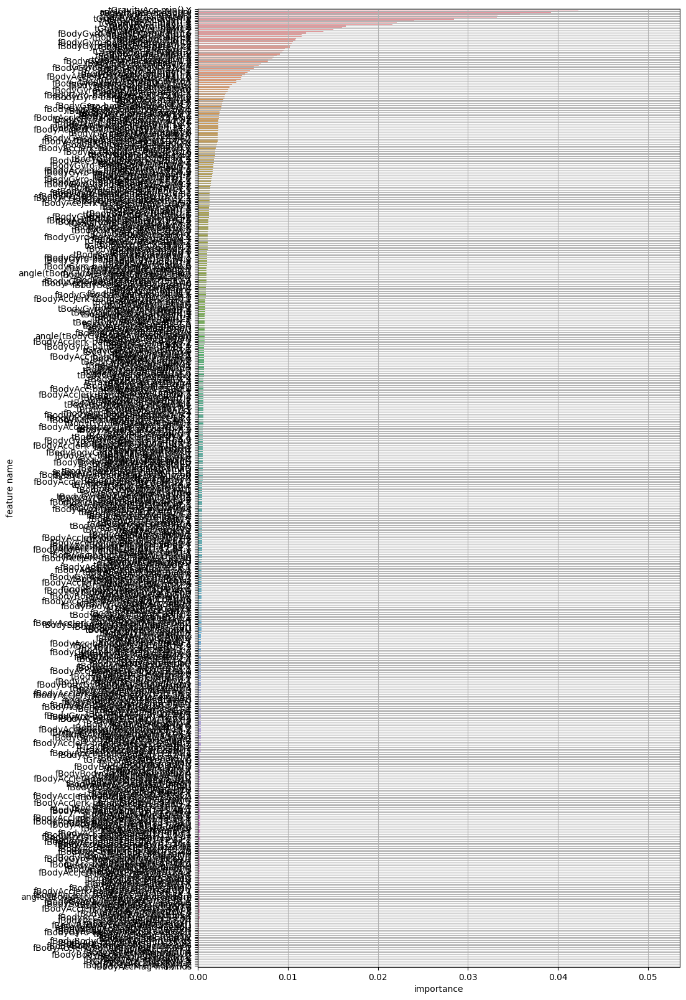

In [66]:
# 변수 중요도 추출
#importance = model.feature_importances_

# Get the names of the features
#names = x_train.columns

# Plot the feature importance using the plot_feature_importance function
sitting = plot_feature_importance(model.feature_importances_, list(x_train), False)

In [67]:
sitting.sort_values(by=['feature_importance'],ascending=False)
sitting.head()

,feature_name,feature_importance
0,tGravityAcc-min()-Y,0.050991
1,"angle(Y,gravityMean)",0.042291
2,tGravityAcc-mean()-Y,0.039215
3,tGravityAcc-max()-Y,0.035794
4,"angle(X,gravityMean)",0.033316


C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\547248038.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


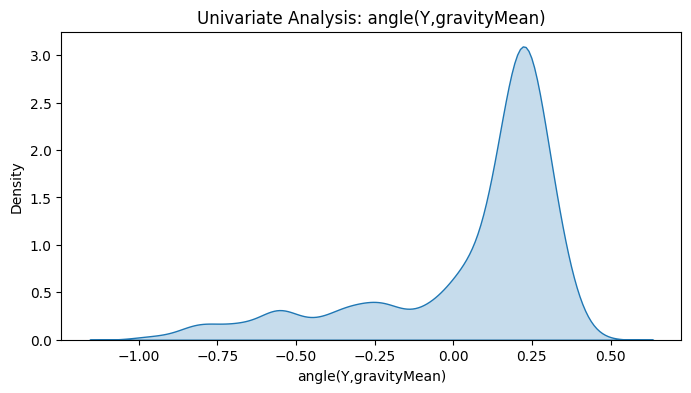

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\547248038.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


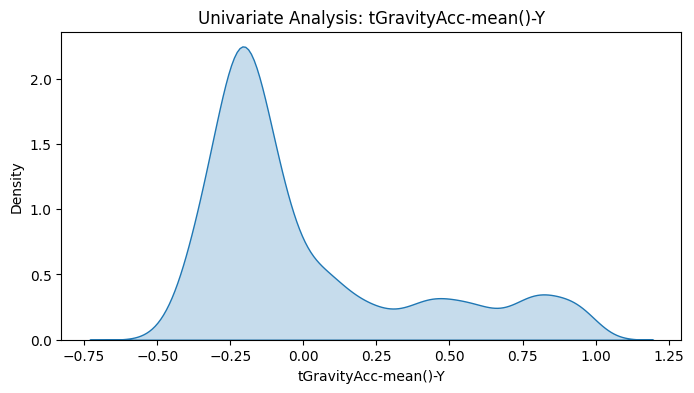

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\547248038.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


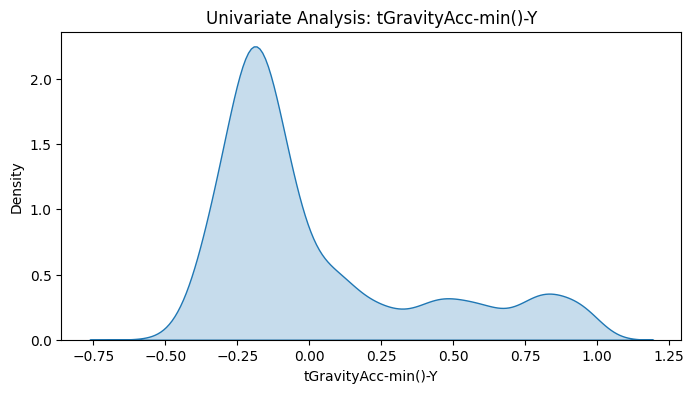

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\547248038.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


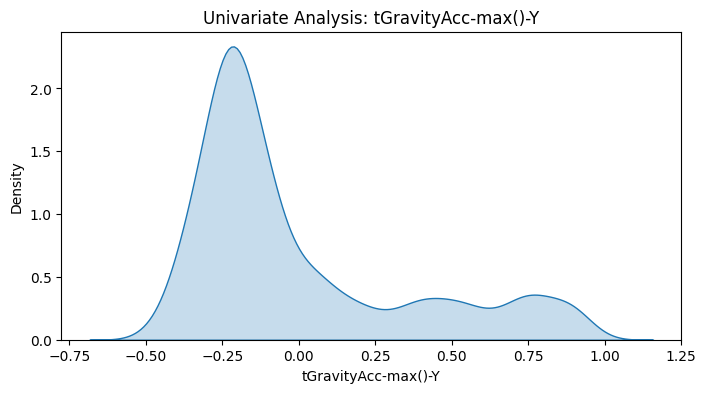

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\547248038.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


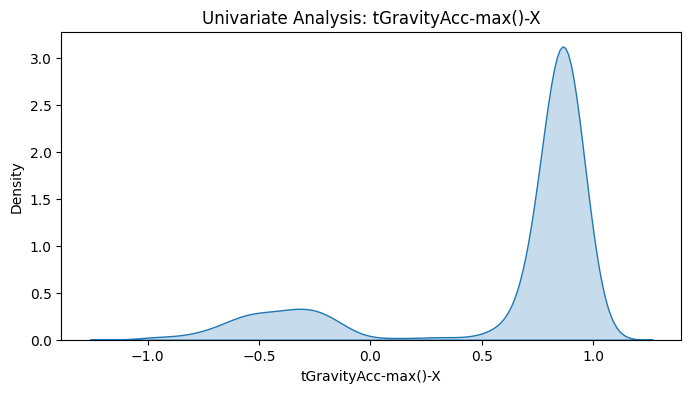

In [68]:
top_5_variables = ['angle(Y,gravityMean)', 'tGravityAcc-mean()-Y', 'tGravityAcc-min()-Y',
                   'tGravityAcc-max()-Y', 'tGravityAcc-max()-X']

for variable in top_5_variables:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data[variable], shade=True)
    plt.title(f'Univariate Analysis: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()


In [69]:
merged_df = pd.merge(sitting, features, on='feature_name')
merged_df

,feature_name,feature_importance,sensor,agg,axis
0,tGravityAcc-min()-Y,0.050991,tGravityAcc,min(),Y
1,"angle(Y,gravityMean)",0.042291,angle,Y,gravityMean
2,tGravityAcc-mean()-Y,0.039215,tGravityAcc,mean(),Y
3,tGravityAcc-max()-Y,0.035794,tGravityAcc,max(),Y
4,"angle(X,gravityMean)",0.033316,angle,X,gravityMean
...,...,...,...,...,...
556,fBodyAccJerk-entropy()-X,0.000065,fBodyAccJerk,entropy(),X
557,tGravityAcc-entropy()-X,0.000063,tGravityAcc,entropy(),X
558,fBodyAcc-maxInds-Z,0.000059,fBodyAcc,maxInds,Z
559,fBodyAccJerk-entropy()-Z,0.000042,fBodyAccJerk,entropy(),Z


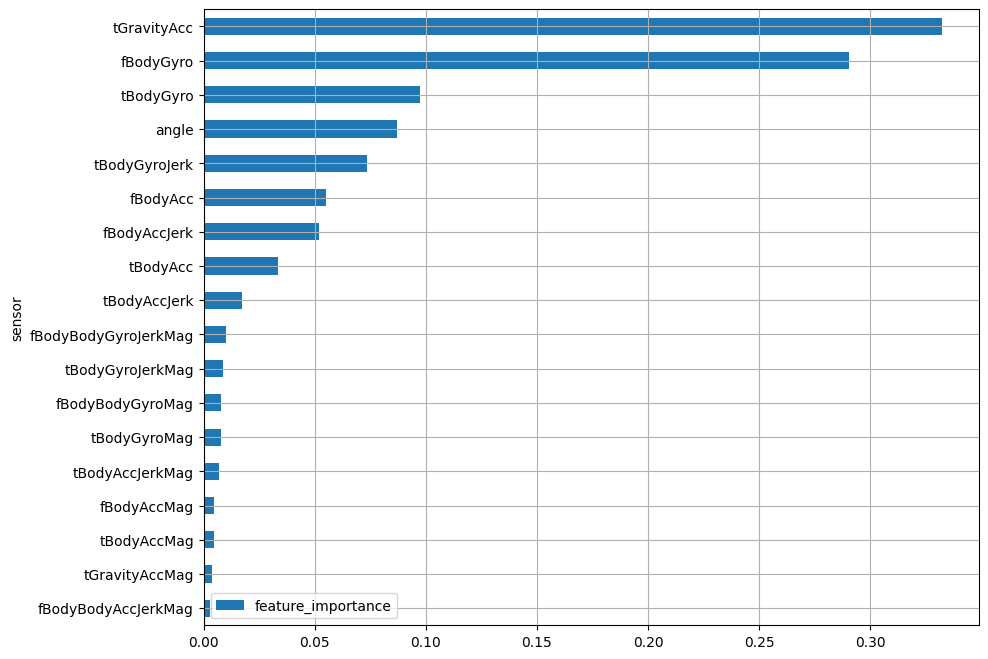

In [70]:
sensor_sum = merged_df.groupby('sensor')['feature_importance'].sum().reset_index().sort_values('feature_importance', ascending=True)
sensor_sum.plot.barh(x='sensor', y='feature_importance', figsize=(10,8))
plt.grid()
plt.show()

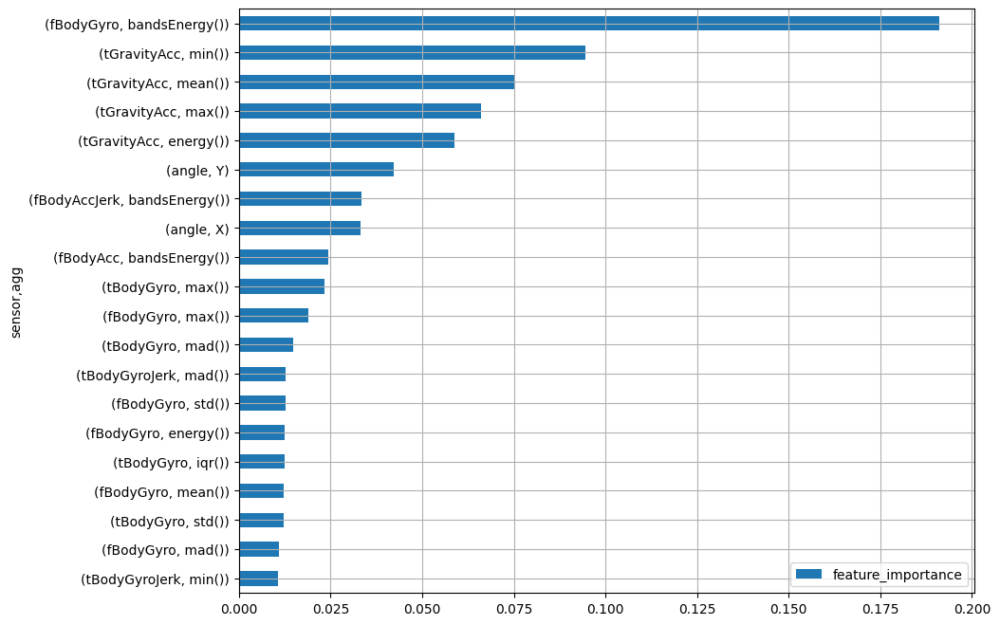

In [71]:
temp=merged_df.groupby(['sensor','agg'])[['feature_importance']].sum().sort_values('feature_importance')
temp.tail(20).plot.barh(figsize=(10,8))
plt.grid()
plt.show()

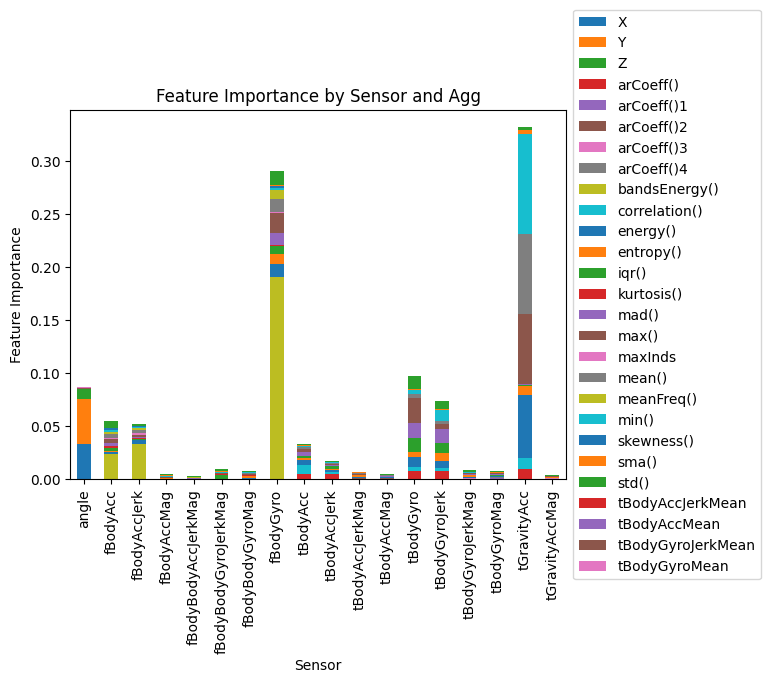

In [72]:
# Perform the analysis for sensor and agg
sensor_agg_analysis = merged_df.groupby(['sensor', 'agg'])['feature_importance'].sum().unstack()

# Visualize the results
ax = sensor_agg_analysis.plot(kind='bar', stacked=True)
plt.xlabel('Sensor')
plt.ylabel('Feature Importance')
plt.title('Feature Importance by Sensor and Agg')

# Adjust legend position
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

### (4) 개별 동작 분석 : is_laying


* **세부 요구사항**
    - Target인 Activity를 is_laying 변수로 변경하시오.
        * 값 1 : LAYING
        * 값 0 : 나머지
    - is_laying 을 예측하기 위한 기본 모델을 생성하시오.
        * x, is_laying 을 이용하여 train과 validation으로 데이터 분할
        * 기본 모델링
    - is_laying 을 구분하는데 중요한 변수 상위 5를 분석하시오.
    - is_laying 을 구분하는데 중요한 변수 그룹을 분석하시오.
        * sensor별
        * sensor+agg 별


In [73]:
is_laying = y.map({'STANDING':0, 'SITTING':0, 'LAYING':1, 
                  'WALKING':0, 'WALKING_UPSTAIRS':0, 'WALKING_DOWNSTAIRS':0})
is_laying

0       0
1       1
2       0
3       0
4       0
       ..
5876    0
5877    0
5878    1
5879    0
5880    0
Name: Activity, Length: 5881, dtype: int64

In [74]:
x_train, x_val, y_train, y_val = train_test_split(x, is_laying, test_size = .3)

In [75]:
model = RandomForestClassifier()
model.fit(x_train, y_train)
pred = model.predict(x_val)

print('accuracy :',accuracy_score(y_val, pred))
print('='*60)
print(confusion_matrix(y_val, pred))
print('='*60)
print(classification_report(y_val, pred))

accuracy : 1.0
[[1440    0]
 [   0  325]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1440
           1       1.00      1.00      1.00       325

    accuracy                           1.00      1765
   macro avg       1.00      1.00      1.00      1765
weighted avg       1.00      1.00      1.00      1765



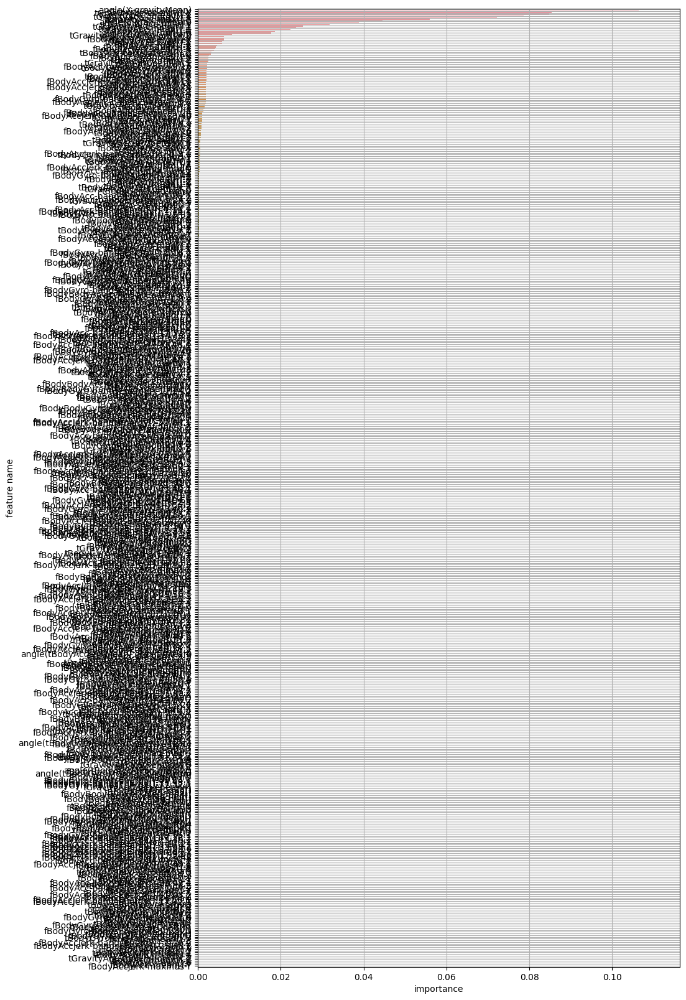

In [76]:
# 변수 중요도 추출
#importance = model.feature_importances_

# Get the names of the features
#names = x_train.columns

# Plot the feature importance using the plot_feature_importance function
laying = plot_feature_importance(model.feature_importances_, list(x_train), False)

In [77]:
laying.sort_values(by=['feature_importance'],ascending=False)
laying.head()

,feature_name,feature_importance
0,"angle(X,gravityMean)",0.110779
1,tGravityAcc-min()-X,0.106464
2,tGravityAcc-energy()-Y,0.085359
3,tGravityAcc-mean()-X,0.084840
4,tGravityAcc-energy()-X,0.078551


C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\3595565466.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


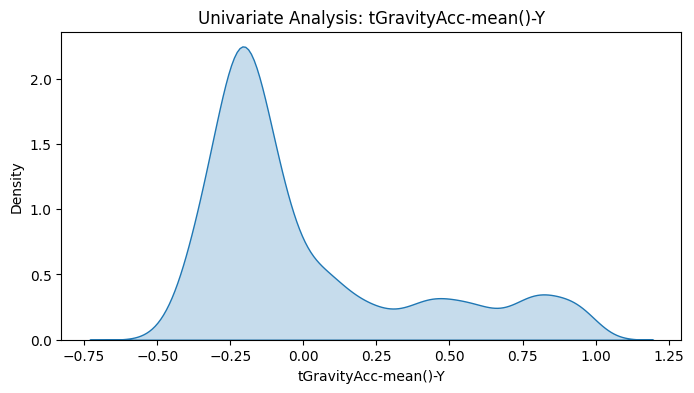

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\3595565466.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


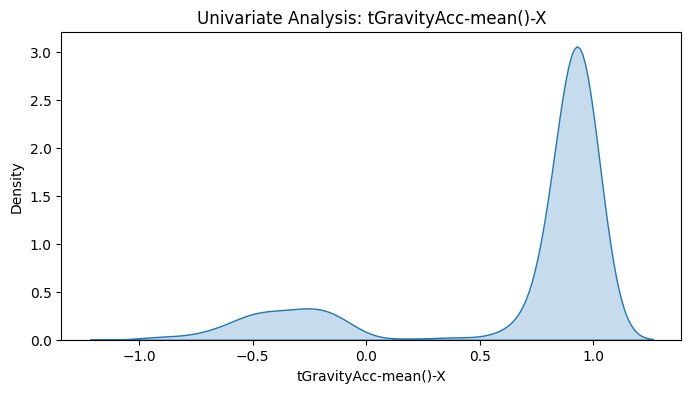

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\3595565466.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


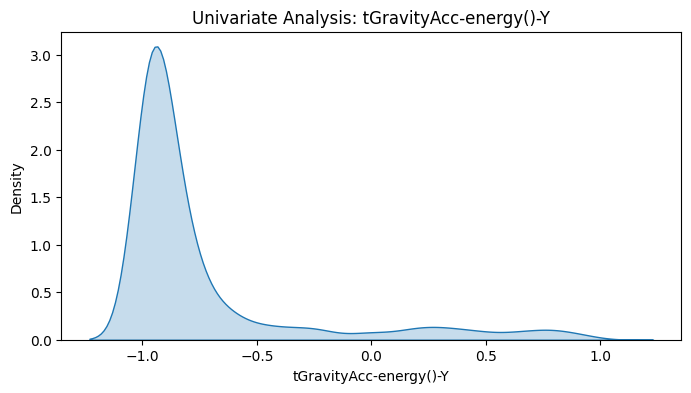

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\3595565466.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


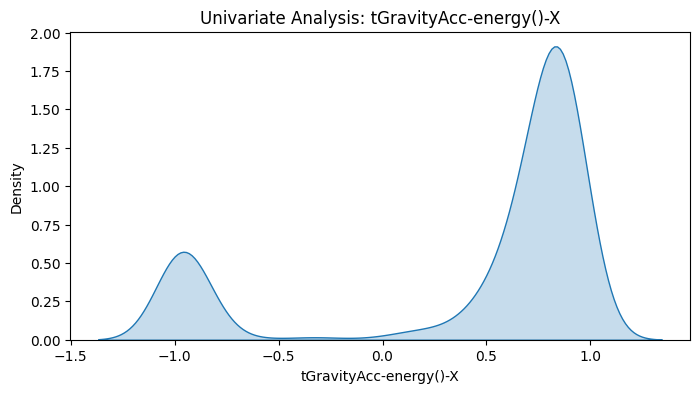

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\3595565466.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


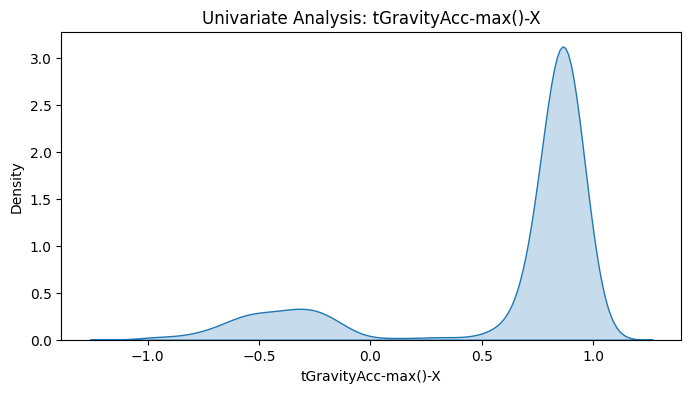

In [78]:
top_5_variables = ['tGravityAcc-mean()-Y', 'tGravityAcc-mean()-X', 'tGravityAcc-energy()-Y',
                   'tGravityAcc-energy()-X', 'tGravityAcc-max()-X']

for variable in top_5_variables:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data[variable], shade=True)
    plt.title(f'Univariate Analysis: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

In [79]:
merged_df = pd.merge(laying, features, on='feature_name')
merged_df

,feature_name,feature_importance,sensor,agg,axis
0,"angle(X,gravityMean)",0.110779,angle,X,gravityMean
1,tGravityAcc-min()-X,0.106464,tGravityAcc,min(),X
2,tGravityAcc-energy()-Y,0.085359,tGravityAcc,energy(),Y
3,tGravityAcc-mean()-X,0.084840,tGravityAcc,mean(),X
4,tGravityAcc-energy()-X,0.078551,tGravityAcc,energy(),X
...,...,...,...,...,...
556,fBodyAcc-mean()-Z,0.000000,fBodyAcc,mean(),Z
557,fBodyGyro-min()-X,0.000000,fBodyGyro,min(),X
558,fBodyGyro-min()-Y,0.000000,fBodyGyro,min(),Y
559,fBodyAcc-mean()-Y,0.000000,fBodyAcc,mean(),Y


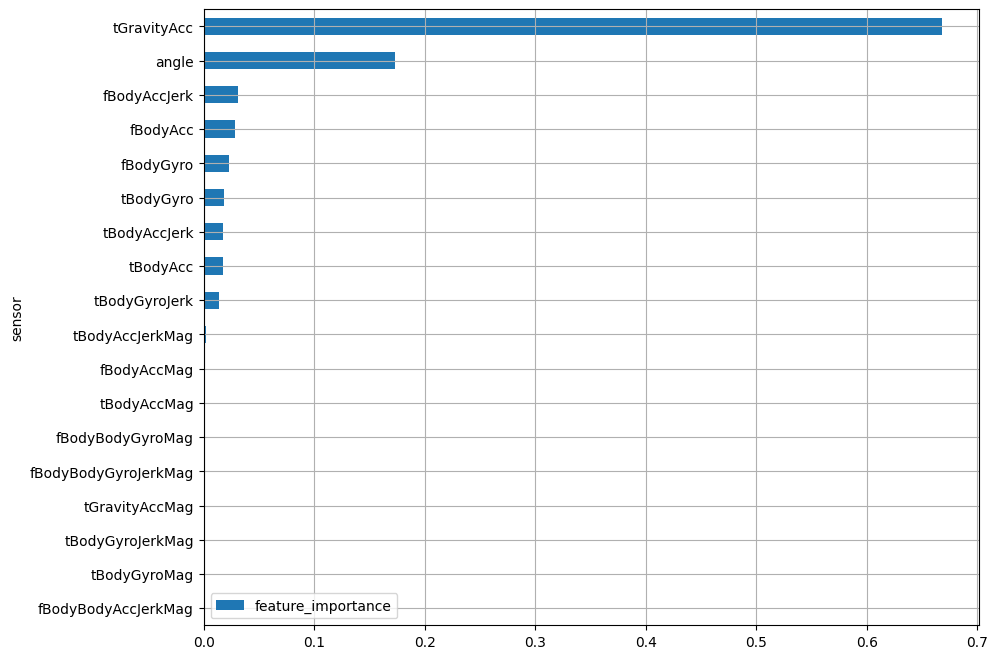

In [80]:
sensor_sum = merged_df.groupby('sensor')['feature_importance'].sum().reset_index().sort_values('feature_importance', ascending=True)
sensor_sum.plot.barh(x='sensor', y='feature_importance', figsize=(10,8))
plt.grid()
plt.show()

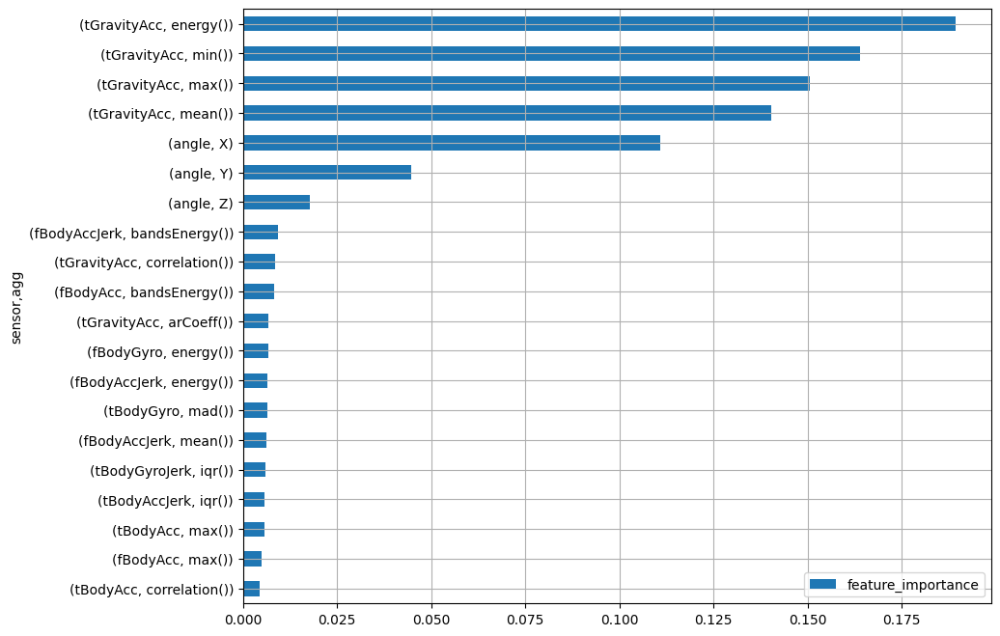

In [81]:
temp=merged_df.groupby(['sensor','agg'])[['feature_importance']].sum().sort_values('feature_importance')
temp.tail(20).plot.barh(figsize=(10,8))
plt.grid()
plt.show()

### (5) 개별 동작 분석 : is_walking


* **세부 요구사항**
    - Target인 Activity를 is_walking 변수로 변경하시오.
        * 값 1 : WALKING
        * 값 0 : 나머지
    - is_walking 을 예측하기 위한 기본 모델을 생성하시오.
        * x, is_walking 을 이용하여 train과 validation으로 데이터 분할
        * 기본 모델링
    - is_walking 을 구분하는데 중요한 변수 상위 5를 분석하시오.
    - is_walking 을 구분하는데 중요한 변수 그룹을 분석하시오.
        * sensor별
        * sensor+agg 별


In [82]:
is_walking = y.map({'STANDING':0, 'SITTING':0, 'LAYING':0, 
                  'WALKING':1, 'WALKING_UPSTAIRS':0, 'WALKING_DOWNSTAIRS':0})
is_walking

0       0
1       0
2       0
3       1
4       0
       ..
5876    0
5877    0
5878    0
5879    0
5880    0
Name: Activity, Length: 5881, dtype: int64

In [83]:
x_train, x_val, y_train, y_val = train_test_split(x, is_walking, test_size = .3)

In [84]:
model = RandomForestClassifier()
model.fit(x_train, y_train)
pred = model.predict(x_val)

print('accuracy :',accuracy_score(y_val, pred))
print('='*60)
print(confusion_matrix(y_val, pred))
print('='*60)
print(classification_report(y_val, pred))

accuracy : 0.9977337110481587
[[1433    0]
 [   4  328]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1433
           1       1.00      0.99      0.99       332

    accuracy                           1.00      1765
   macro avg       1.00      0.99      1.00      1765
weighted avg       1.00      1.00      1.00      1765



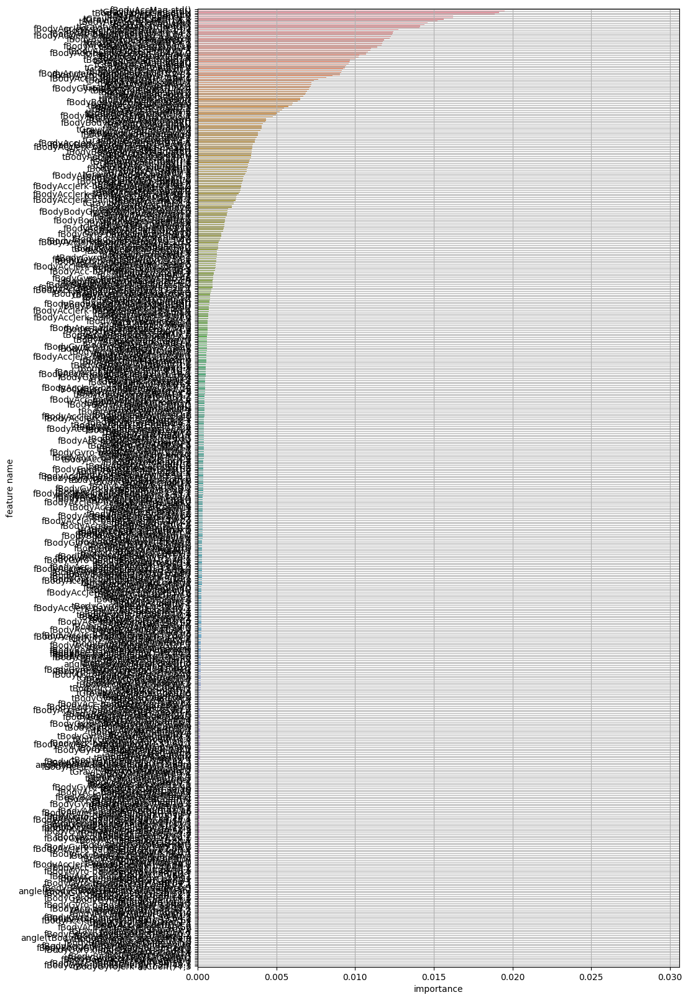

In [85]:
# 변수 중요도 추출
#importance = model.feature_importances_

# Get the names of the features
#names = x_train.columns

# Plot the feature importance using the plot_feature_importance function
walking = plot_feature_importance(model.feature_importances_, list(x_train), False)

In [86]:
walking.sort_values(by=['feature_importance'],ascending=False)
walking.head()

,feature_name,feature_importance
0,fBodyAccMag-std(),0.029149
1,tGravityAccMag-std(),0.019501
2,tBodyGyroJerk-mad()-X,0.019131
3,fBodyAccMag-mad(),0.018878
4,fBodyAcc-max()-X,0.016218


C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2691117659.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


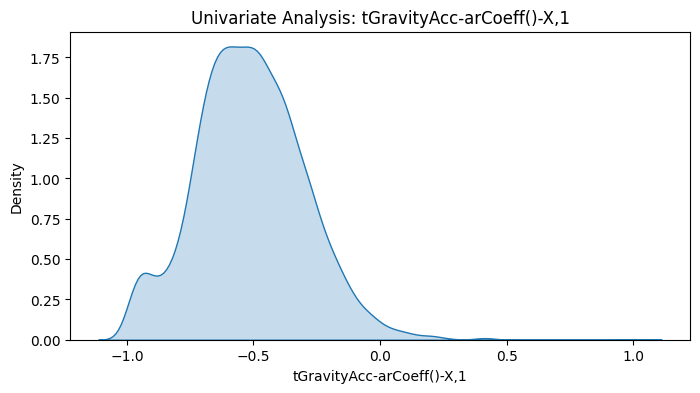

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2691117659.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


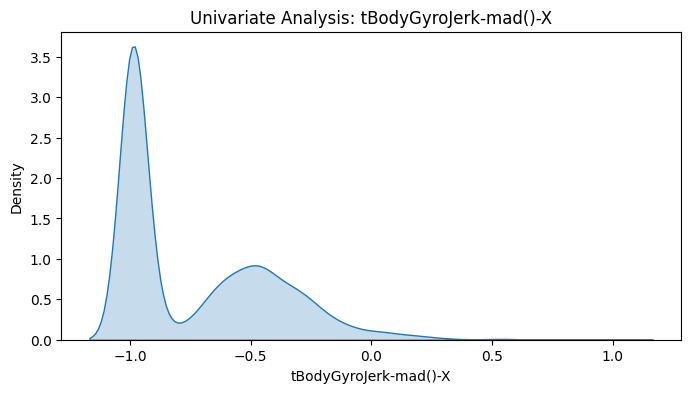

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2691117659.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


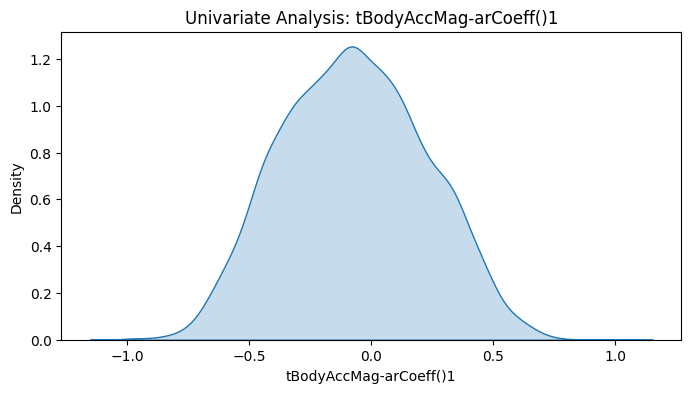

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2691117659.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


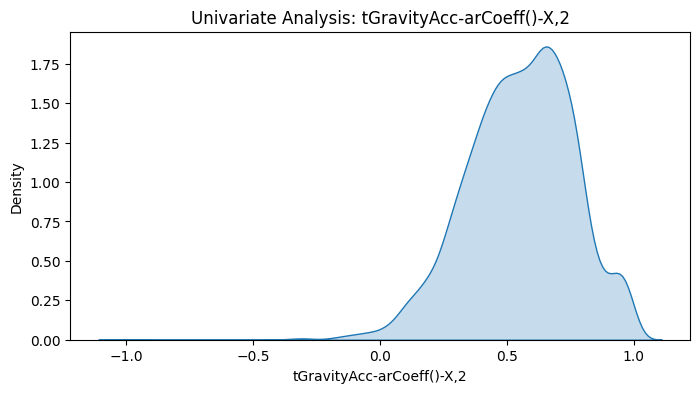

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2691117659.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


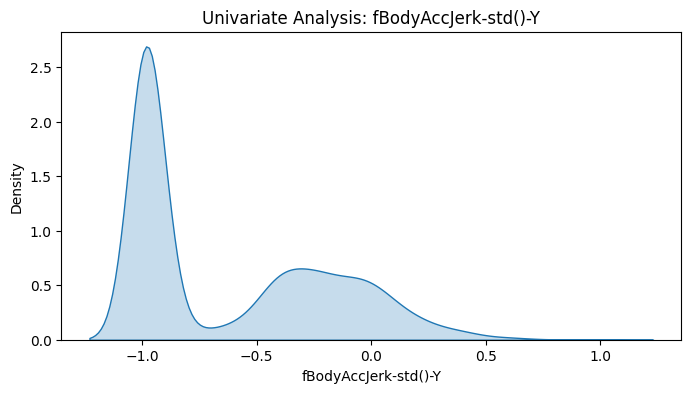

In [87]:
top_5_variables = ['tGravityAcc-arCoeff()-X,1', 'tBodyGyroJerk-mad()-X', 'tBodyAccMag-arCoeff()1',
                   'tGravityAcc-arCoeff()-X,2', 'fBodyAccJerk-std()-Y']

for variable in top_5_variables:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data[variable], shade=True)
    plt.title(f'Univariate Analysis: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

In [88]:
merged_df = pd.merge(walking, features, on='feature_name')
merged_df

,feature_name,feature_importance,sensor,agg,axis
0,fBodyAccMag-std(),0.029149,fBodyAccMag,std(),NaN
1,tGravityAccMag-std(),0.019501,tGravityAccMag,std(),NaN
2,tBodyGyroJerk-mad()-X,0.019131,tBodyGyroJerk,mad(),X
3,fBodyAccMag-mad(),0.018878,fBodyAccMag,mad(),NaN
4,fBodyAcc-max()-X,0.016218,fBodyAcc,max(),X
...,...,...,...,...,...
556,tBodyGyroJerkMag-arCoeff()2,0.000025,tBodyGyroJerkMag,arCoeff()2,NaN
557,fBodyBodyAccJerkMag-mean(),0.000022,fBodyBodyAccJerkMag,mean(),NaN
558,"tBodyAcc-arCoeff()-Y,1",0.000021,tBodyAcc,arCoeff(),"Y,1"
559,"fBodyAcc-bandsEnergy()-49,56.2",0.000018,fBodyAcc,bandsEnergy(),"49,56.2"


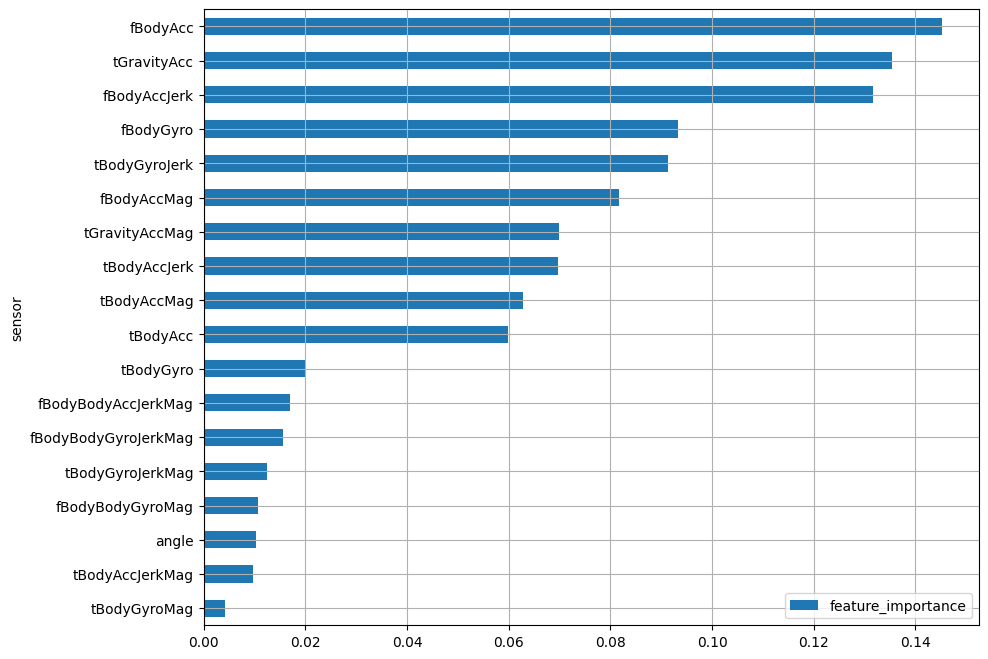

In [89]:
sensor_sum = merged_df.groupby('sensor')['feature_importance'].sum().reset_index().sort_values('feature_importance', ascending=True)
sensor_sum.plot.barh(x='sensor', y='feature_importance', figsize=(10,8))
plt.grid()
plt.show()

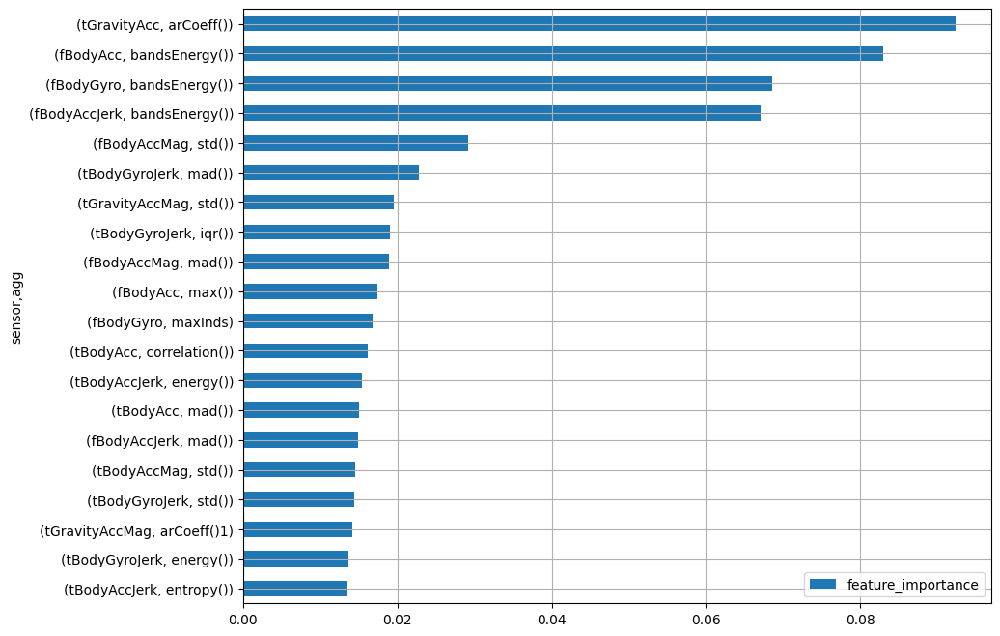

In [90]:
temp=merged_df.groupby(['sensor','agg'])[['feature_importance']].sum().sort_values('feature_importance')
temp.tail(20).plot.barh(figsize=(10,8))
plt.grid()
plt.show()

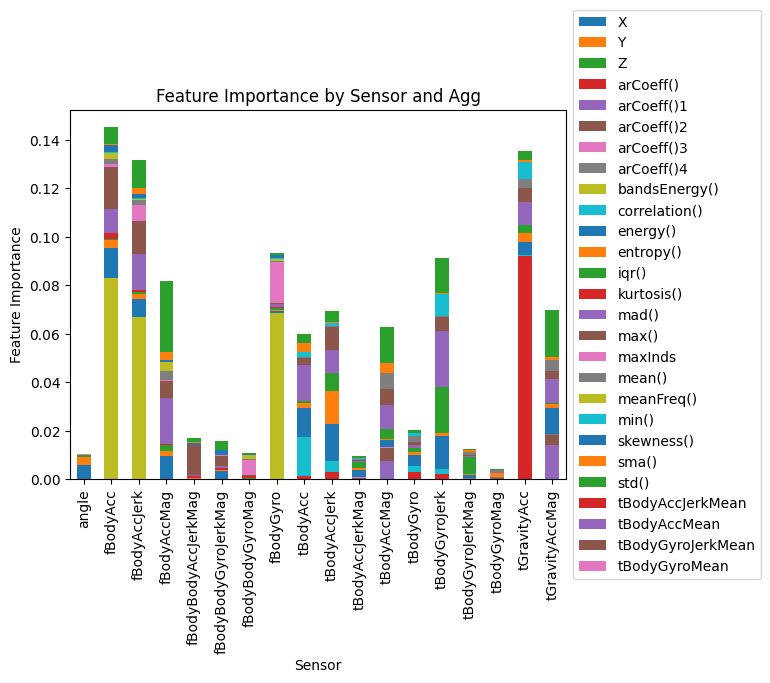

In [91]:
# Perform the analysis for sensor and agg
sensor_agg_analysis = merged_df.groupby(['sensor', 'agg'])['feature_importance'].sum().unstack()

# Visualize the results
ax = sensor_agg_analysis.plot(kind='bar', stacked=True)
plt.xlabel('Sensor')
plt.ylabel('Feature Importance')
plt.title('Feature Importance by Sensor and Agg')

# Adjust legend position
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

### (6) 개별 동작 분석 : is_walking_up


* **세부 요구사항**
    - Target인 Activity를 is_walking_up 변수로 변경하시오.
        * 값 1 : WALKING_UPSTAIRS
        * 값 0 : 나머지
    - is_walking_up 을 예측하기 위한 기본 모델을 생성하시오.
        * x, is_walking_up 을 이용하여 train과 validation으로 데이터 분할
        * 기본 모델링
    - is_walking_up 을 구분하는데 중요한 변수 상위 5를 분석하시오.
    - is_walking_up 을 구분하는데 중요한 변수 그룹을 분석하시오.
        * sensor별
        * sensor+agg 별


In [92]:
is_walking_up = y.map({'STANDING':0, 'SITTING':0, 'LAYING':0, 
                  'WALKING':0, 'WALKING_UPSTAIRS':1, 'WALKING_DOWNSTAIRS':0})
is_walking_up

0       0
1       0
2       0
3       0
4       0
       ..
5876    0
5877    1
5878    0
5879    1
5880    0
Name: Activity, Length: 5881, dtype: int64

In [93]:
x_train, x_val, y_train, y_val = train_test_split(x, is_walking_up, test_size = .3)

In [94]:
model = RandomForestClassifier()
model.fit(x_train, y_train)
pred = model.predict(x_val)

print('accuracy :',accuracy_score(y_val, pred))
print('='*60)
print(confusion_matrix(y_val, pred))
print('='*60)
print(classification_report(y_val, pred))

accuracy : 0.9971671388101983
[[1494    2]
 [   3  266]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1496
           1       0.99      0.99      0.99       269

    accuracy                           1.00      1765
   macro avg       1.00      0.99      0.99      1765
weighted avg       1.00      1.00      1.00      1765



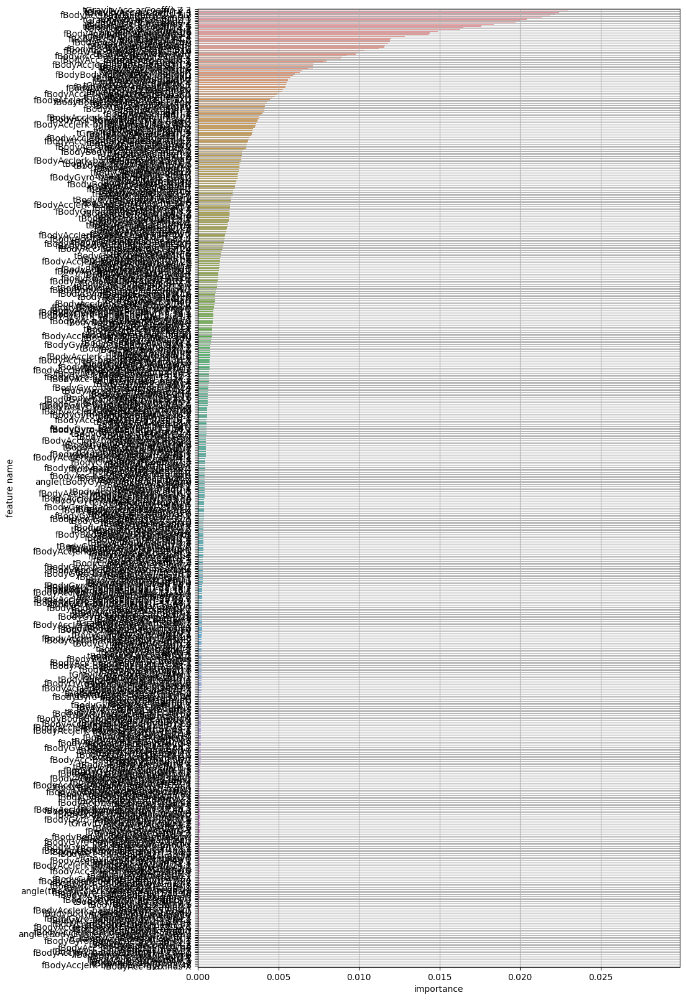

In [95]:
# 변수 중요도 추출
#importance = model.feature_importances_

# Get the names of the features
#names = x_train.columns

# Plot the feature importance using the plot_feature_importance function
walking_up = plot_feature_importance(model.feature_importances_, list(x_train), False)

In [96]:
walking_up.sort_values(by=['feature_importance'],ascending=False)
walking_up.head()

,feature_name,feature_importance
0,"tGravityAcc-arCoeff()-Z,3",0.028493
1,"tGravityAcc-arCoeff()-Y,4",0.022963
2,"tGravityAcc-arCoeff()-Y,3",0.022408
3,"fBodyAcc-bandsEnergy()-1,8.2",0.022150
4,tGravityAcc-min()-Y,0.021898


C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2016049575.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


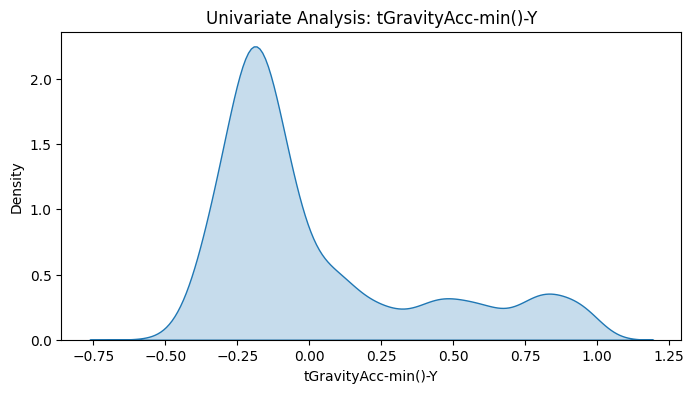

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2016049575.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


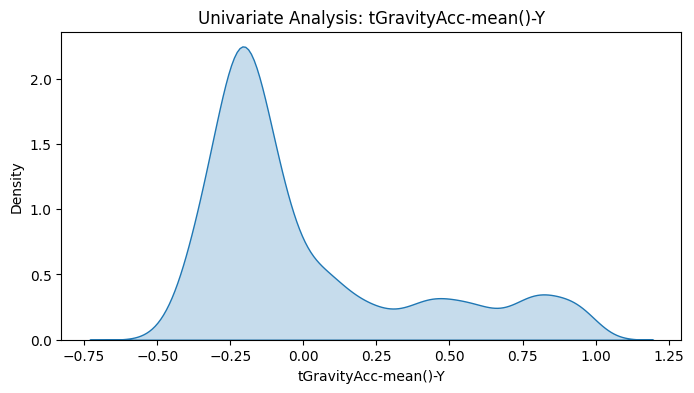

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2016049575.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


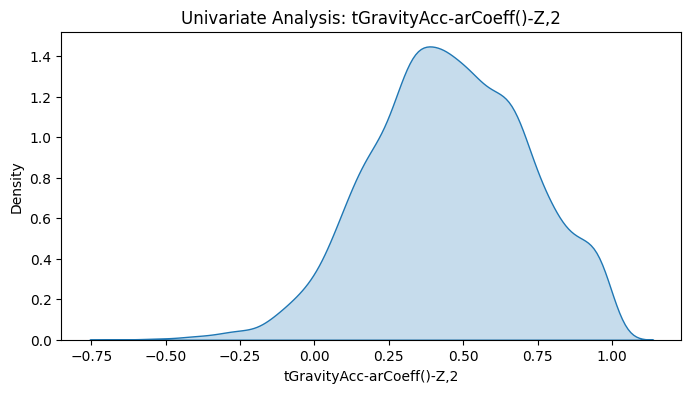

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2016049575.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


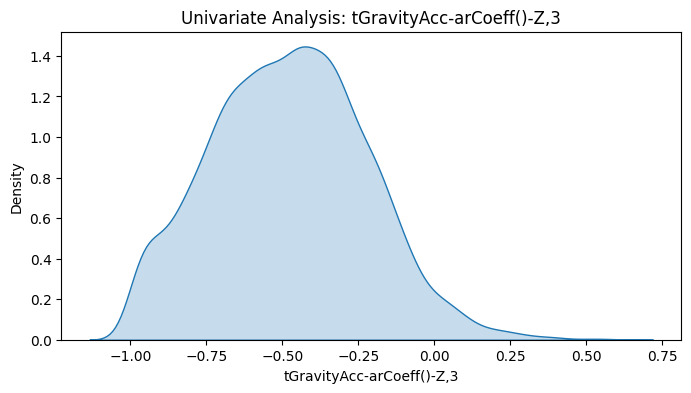

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\2016049575.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


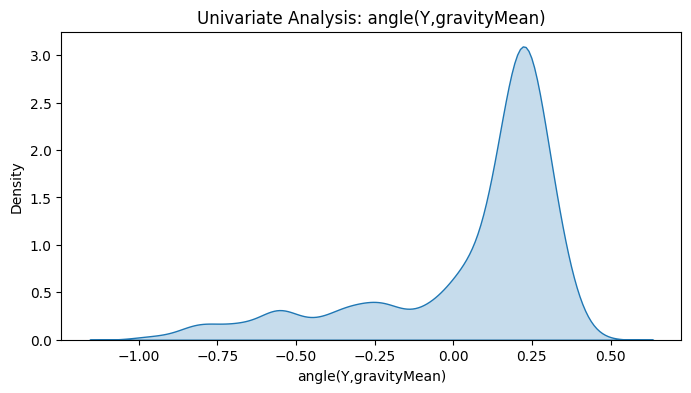

In [97]:
top_5_variables = ['tGravityAcc-min()-Y', 'tGravityAcc-mean()-Y', 'tGravityAcc-arCoeff()-Z,2',
                   'tGravityAcc-arCoeff()-Z,3', 'angle(Y,gravityMean)']

for variable in top_5_variables:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data[variable], shade=True)
    plt.title(f'Univariate Analysis: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

In [98]:
merged_df = pd.merge(walking_up, features, on='feature_name')
merged_df

,feature_name,feature_importance,sensor,agg,axis
0,"tGravityAcc-arCoeff()-Z,3",0.028493,tGravityAcc,arCoeff(),"Z,3"
1,"tGravityAcc-arCoeff()-Y,4",0.022963,tGravityAcc,arCoeff(),"Y,4"
2,"tGravityAcc-arCoeff()-Y,3",0.022408,tGravityAcc,arCoeff(),"Y,3"
3,"fBodyAcc-bandsEnergy()-1,8.2",0.022150,fBodyAcc,bandsEnergy(),"1,8.2"
4,tGravityAcc-min()-Y,0.021898,tGravityAcc,min(),Y
...,...,...,...,...,...
556,fBodyGyro-skewness()-X,0.000023,fBodyGyro,skewness(),X
557,"tBodyGyro-arCoeff()-Y,2",0.000021,tBodyGyro,arCoeff(),"Y,2"
558,tGravityAcc-entropy()-Y,0.000019,tGravityAcc,entropy(),Y
559,"fBodyAccJerk-bandsEnergy()-33,48",0.000000,fBodyAccJerk,bandsEnergy(),"33,48"


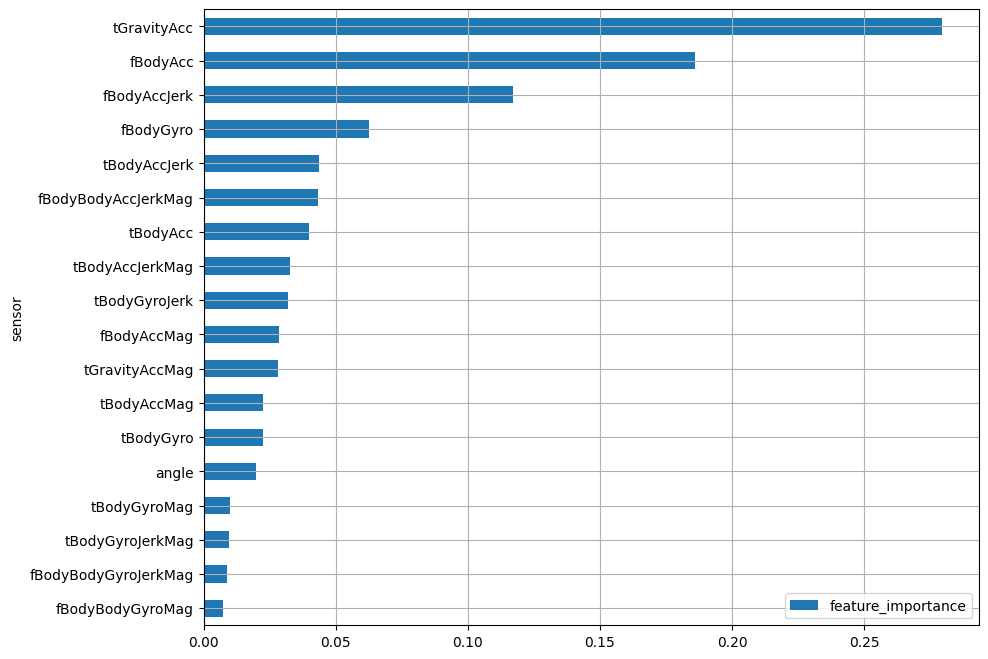

In [99]:
sensor_sum = merged_df.groupby('sensor')['feature_importance'].sum().reset_index().sort_values('feature_importance', ascending=True)
sensor_sum.plot.barh(x='sensor', y='feature_importance', figsize=(10,8))
plt.grid()
plt.show()

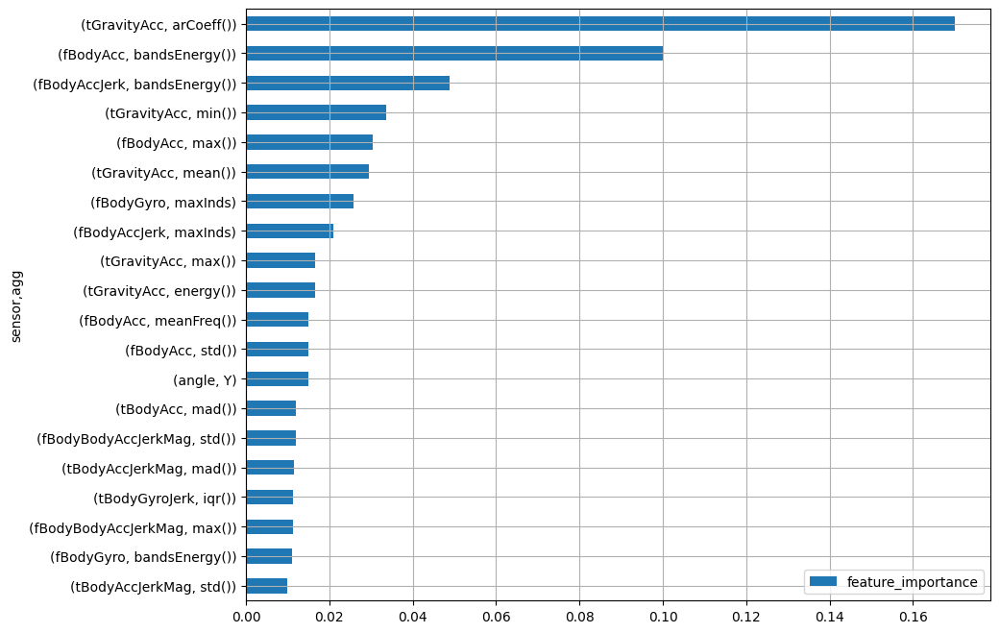

In [100]:
temp=merged_df.groupby(['sensor','agg'])[['feature_importance']].sum().sort_values('feature_importance')
temp.tail(20).plot.barh(figsize=(10,8))
plt.grid()
plt.show()

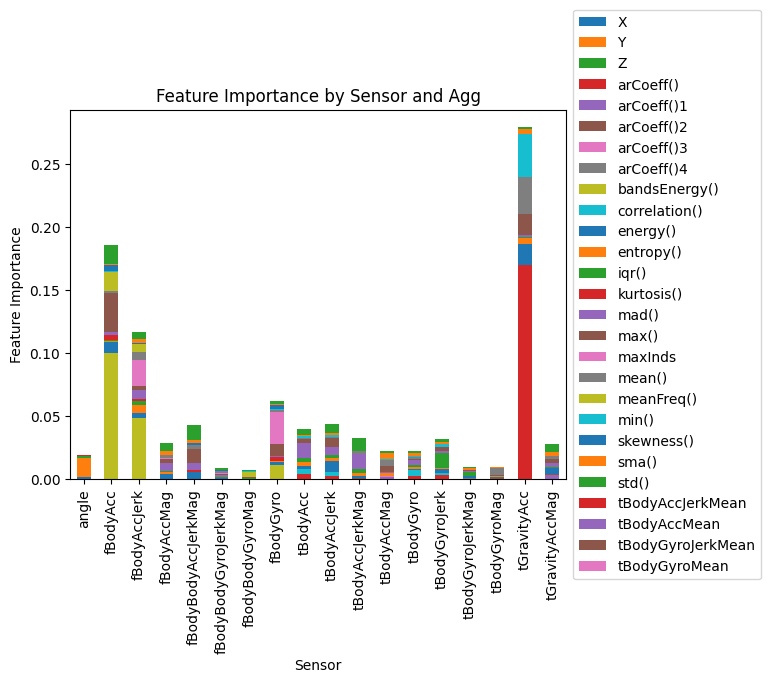

In [101]:
# Perform the analysis for sensor and agg
sensor_agg_analysis = merged_df.groupby(['sensor', 'agg'])['feature_importance'].sum().unstack()

# Visualize the results
ax = sensor_agg_analysis.plot(kind='bar', stacked=True)
plt.xlabel('Sensor')
plt.ylabel('Feature Importance')
plt.title('Feature Importance by Sensor and Agg')

# Adjust legend position
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

### (7) 개별 동작 분석 : is_walking_down


* **세부 요구사항**
    - Target인 Activity를 is_walking_down 변수로 변경하시오.
        * 값 1 : WALKING_DOWNSTAIRS
        * 값 0 : 나머지
    - is_walking_down 을 예측하기 위한 기본 모델을 생성하시오.
        * x, is_walking_down 을 이용하여 train과 validation으로 데이터 분할
        * 기본 모델링
    - is_walking_down 을 구분하는데 중요한 변수 상위 5를 분석하시오.
    - is_walking_down 을 구분하는데 중요한 변수 그룹을 분석하시오.
        * sensor별
        * sensor+agg 별


In [102]:
is_walking_down = y.map({'STANDING':0, 'SITTING':0, 'LAYING':0, 
                  'WALKING':0, 'WALKING_UPSTAIRS':0, 'WALKING_DOWNSTAIRS':1})
is_walking_down

0       0
1       0
2       0
3       0
4       1
       ..
5876    0
5877    0
5878    0
5879    0
5880    0
Name: Activity, Length: 5881, dtype: int64

In [103]:
x_train, x_val, y_train, y_val = train_test_split(x, is_walking_down, test_size = .3)

In [104]:
model = RandomForestClassifier()
model.fit(x_train, y_train)
pred = model.predict(x_val)

print('accuracy :',accuracy_score(y_val, pred))
print('='*60)
print(confusion_matrix(y_val, pred))
print('='*60)
print(classification_report(y_val, pred))

accuracy : 0.9886685552407932
[[1536    2]
 [  18  209]]
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1538
           1       0.99      0.92      0.95       227

    accuracy                           0.99      1765
   macro avg       0.99      0.96      0.97      1765
weighted avg       0.99      0.99      0.99      1765



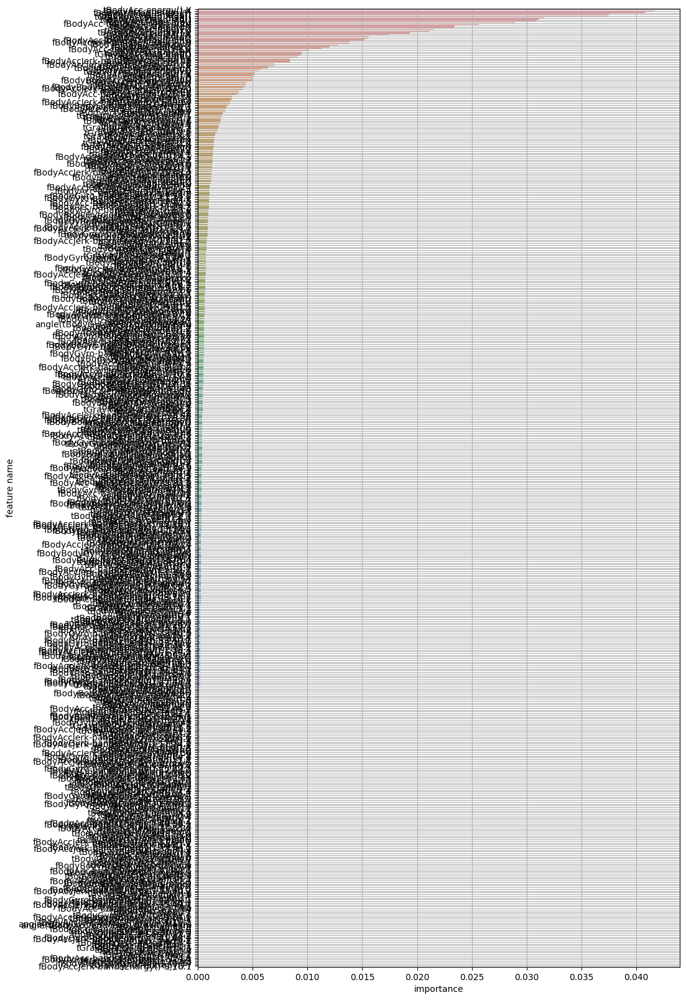

In [105]:
# 변수 중요도 추출
#importance = model.feature_importances_

# Get the names of the features
#names = x_train.columns

# Plot the feature importance using the plot_feature_importance function
walking_down = plot_feature_importance(model.feature_importances_, list(x_train), False)

In [106]:
walking_down.sort_values(by=['feature_importance'],ascending=False)
walking_down.head()

,feature_name,feature_importance
0,tBodyAcc-energy()-X,0.041895
1,fBodyAcc-energy()-X,0.041704
2,fBodyAccMag-energy(),0.040776
3,fBodyAccMag-mean(),0.037487
4,tGravityAccMag-max(),0.037452


C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1119774654.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


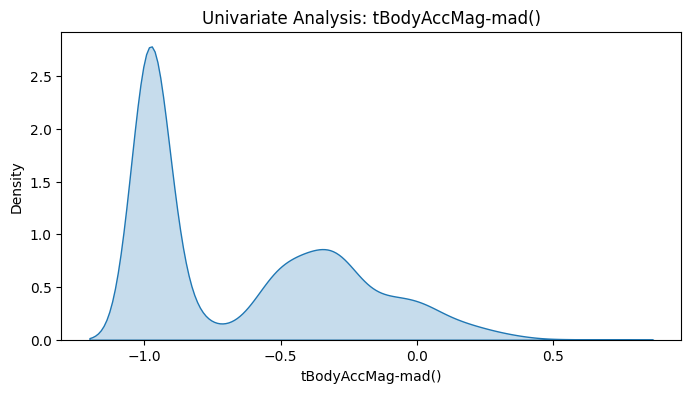

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1119774654.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


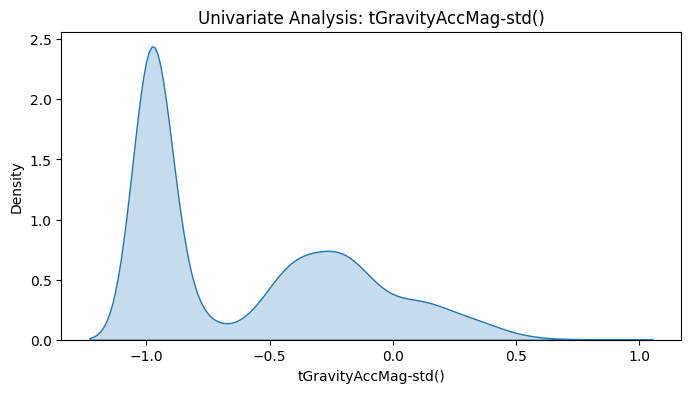

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1119774654.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


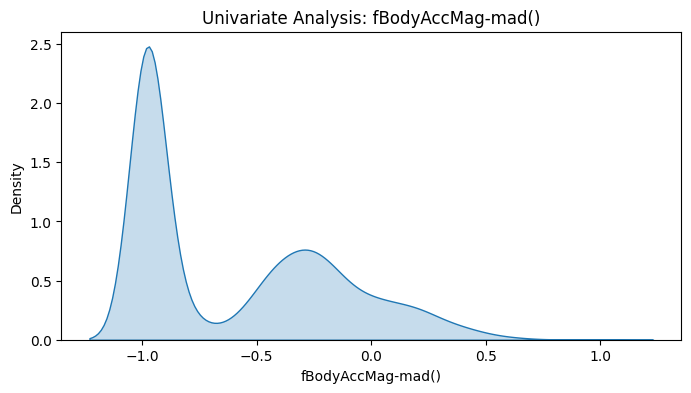

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1119774654.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


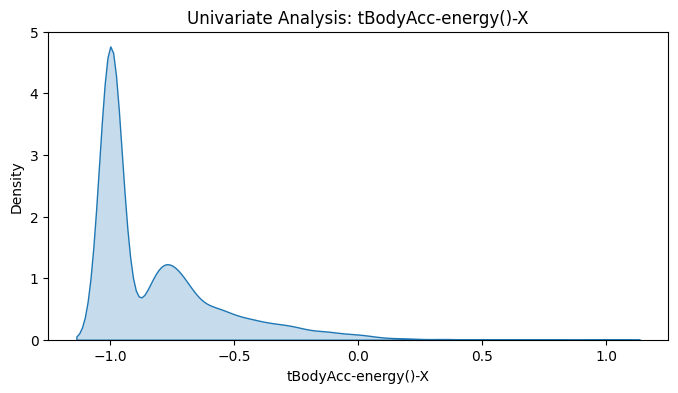

C:\Users\wldud\AppData\Local\Temp\ipykernel_16048\1119774654.py:6: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data=data[variable], shade=True)


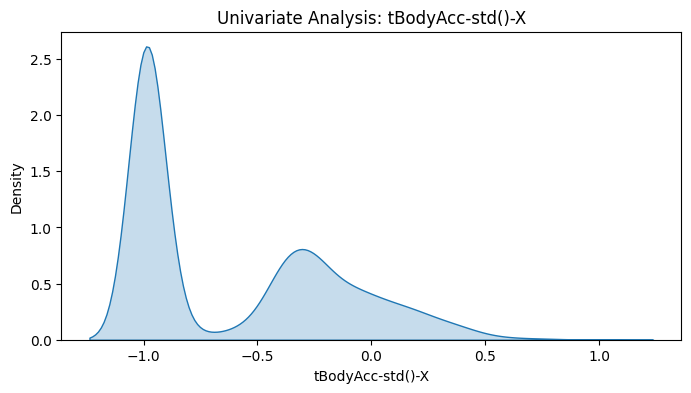

In [107]:
top_5_variables = ['tBodyAccMag-mad()', 'tGravityAccMag-std()', 'fBodyAccMag-mad()',
                   'tBodyAcc-energy()-X', 'tBodyAcc-std()-X']

for variable in top_5_variables:
    plt.figure(figsize=(8, 4))
    sns.kdeplot(data=data[variable], shade=True)
    plt.title(f'Univariate Analysis: {variable}')
    plt.xlabel(variable)
    plt.ylabel('Density')
    plt.show()

In [108]:
merged_df = pd.merge(walking_down, features, on='feature_name')
merged_df

,feature_name,feature_importance,sensor,agg,axis
0,tBodyAcc-energy()-X,0.041895,tBodyAcc,energy(),X
1,fBodyAcc-energy()-X,0.041704,fBodyAcc,energy(),X
2,fBodyAccMag-energy(),0.040776,fBodyAccMag,energy(),NaN
3,fBodyAccMag-mean(),0.037487,fBodyAccMag,mean(),NaN
4,tGravityAccMag-max(),0.037452,tGravityAccMag,max(),NaN
...,...,...,...,...,...
556,"fBodyAccJerk-bandsEnergy()-57,64",0.000017,fBodyAccJerk,bandsEnergy(),"57,64"
557,fBodyBodyGyroMag-min(),0.000015,fBodyBodyGyroMag,min(),NaN
558,"fBodyAcc-bandsEnergy()-49,64",0.000014,fBodyAcc,bandsEnergy(),"49,64"
559,tGravityAcc-entropy()-Y,0.000000,tGravityAcc,entropy(),Y


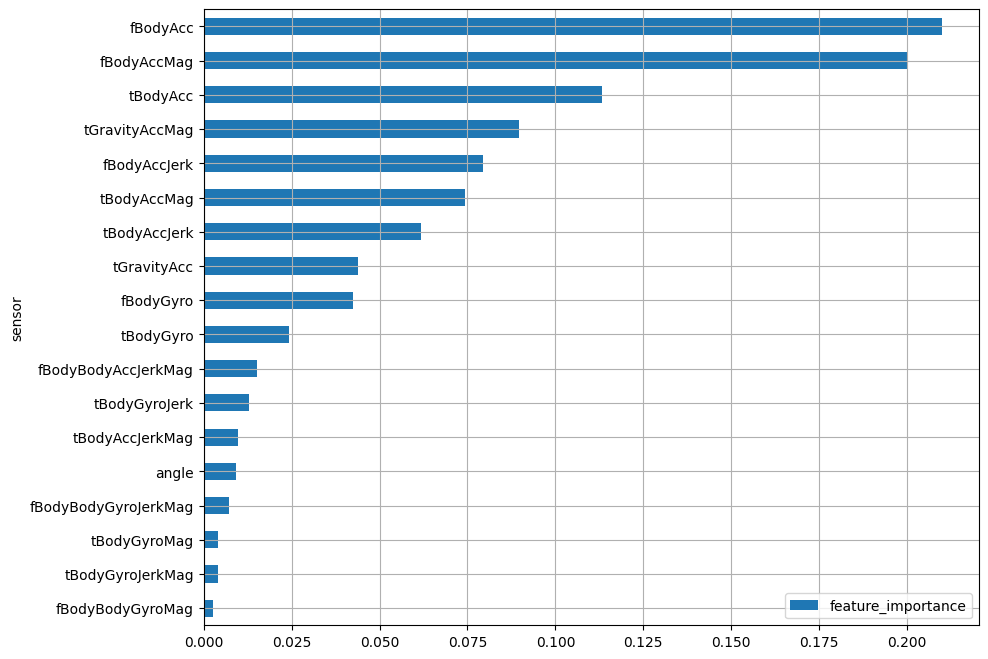

In [109]:
sensor_sum = merged_df.groupby('sensor')['feature_importance'].sum().reset_index().sort_values('feature_importance', ascending=True)
sensor_sum.plot.barh(x='sensor', y='feature_importance', figsize=(10,8))
plt.grid()
plt.show()

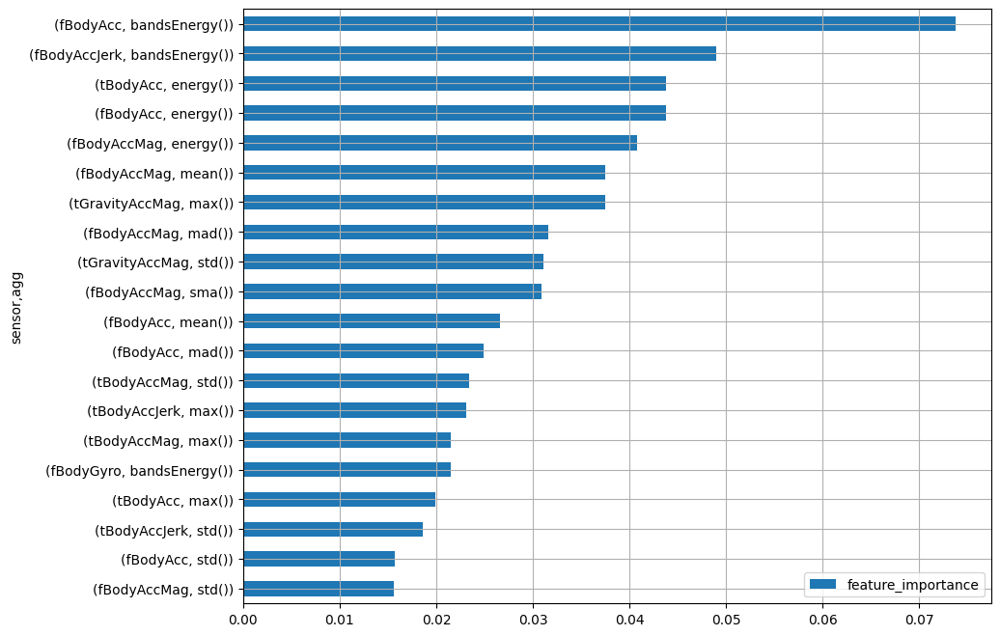

In [110]:
temp=merged_df.groupby(['sensor','agg'])[['feature_importance']].sum().sort_values('feature_importance')
temp.tail(20).plot.barh(figsize=(10,8))
plt.grid()
plt.show()

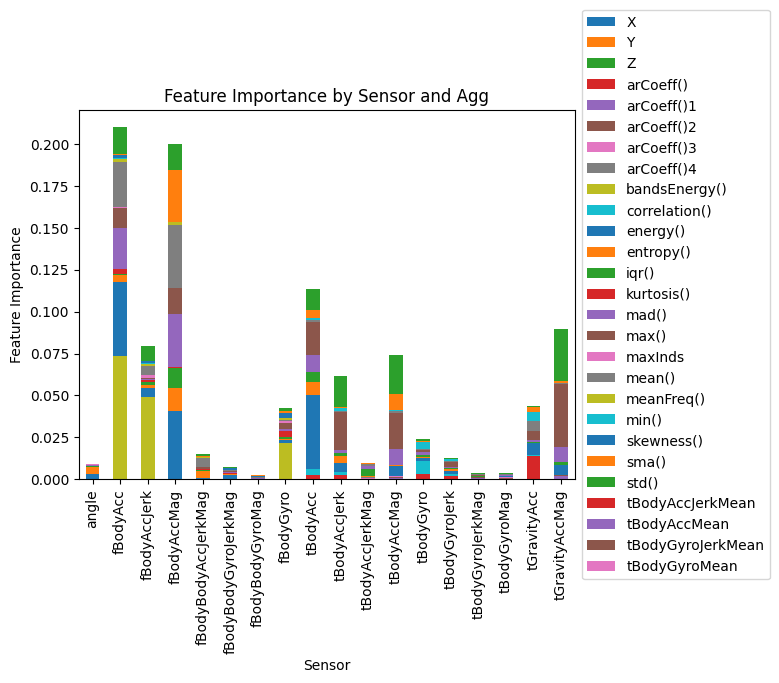

In [111]:
# Perform the analysis for sensor and agg
sensor_agg_analysis = merged_df.groupby(['sensor', 'agg'])['feature_importance'].sum().unstack()

# Visualize the results
ax = sensor_agg_analysis.plot(kind='bar', stacked=True)
plt.xlabel('Sensor')
plt.ylabel('Feature Importance')
plt.title('Feature Importance by Sensor and Agg')

# Adjust legend position
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))

plt.show()

## 5.특성 중요도 저장하기

* **세부 요구사항**
    - 지금까지 변수 중요도를 다양한 관점에서 뽑고 분석을 해 보았습니다.
        - 관점1 : 6개 행동 구분
        - 관점2 : 동적, 정적 행동 구분
        - 관점3 : Standing 여부 구분
        - 관점4 : Sitting 여부 구분
        - 관점5 : Laying 여부 구분
        - 관점6 : Walking 여부 구분
        - 관점7 : Walking_upstairs 여부 구분
        - 관점8 : Walking_downstairs 여부 구분
    - 모든 관점의 변수 중요도를 하나로 합친 후 저장
        - merge를 이용하여 features와 합칩니다.
        - joblib 패키지의 dump를 이용하여 결과를 저장합니다.

### (1) 하나로 합치기
* 합치기 위해서는 중요도 결과에서 feature_importance 칼럼 이름을 수정해야 합니다.
* pd.merge를 이용해서 하나씩 합치는 작업을 반복 합니다.

In [112]:
dynamic.columns=['feature_name','feature_importance_dynamic']
features=pd.merge(features,dynamic,how='inner',on='feature_name')
standing.columns=['feature_name','feature_importance_standing']
features=pd.merge(features,standing,how='inner',on='feature_name')
sitting.columns=['feature_name','feature_importance_sitting']
features=pd.merge(features,sitting,how='inner',on='feature_name')
laying.columns=['feature_name','feature_importance_laying']
features=pd.merge(features,laying,how='inner',on='feature_name')
walking.columns=['feature_name','feature_importance_walking']
features=pd.merge(features,walking,how='inner',on='feature_name')
walking_up.columns=['feature_name','feature_importance_walking_up']
features=pd.merge(features,walking_up,how='inner',on='feature_name')
walking_down.columns=['feature_name','feature_importance_walking_down']
features=pd.merge(features,walking_down,how='inner',on='feature_name')
features

,sensor,agg,axis,feature_name,feature_importance_dynamic,feature_importance_standing,feature_importance_sitting,feature_importance_laying,feature_importance_walking,feature_importance_walking_up,feature_importance_walking_down
0,tBodyAcc,mean(),X,tBodyAcc-mean()-X,0.000000,0.000163,0.000169,0.000116,0.000082,0.000201,0.000166
1,tBodyAcc,mean(),Y,tBodyAcc-mean()-Y,0.000000,0.000222,0.000969,0.000088,0.000241,0.000095,0.000534
2,tBodyAcc,mean(),Z,tBodyAcc-mean()-Z,0.000099,0.000365,0.000368,0.000020,0.000148,0.000493,0.000278
3,tBodyAcc,std(),X,tBodyAcc-std()-X,0.019758,0.004528,0.000447,0.001001,0.003124,0.004132,0.009051
4,tBodyAcc,std(),Y,tBodyAcc-std()-Y,0.000007,0.000702,0.000290,0.000289,0.000150,0.000061,0.002013
...,...,...,...,...,...,...,...,...,...,...,...
556,angle,tBodyGyroMean,gravityMean,"angle(tBodyGyroMean,gravityMean)",0.000000,0.000690,0.000734,0.000000,0.000130,0.000410,0.000571
557,angle,tBodyGyroJerkMean,gravityMean,"angle(tBodyGyroJerkMean,gravityMean)",0.000000,0.002081,0.000939,0.000001,0.000071,0.000058,0.000053
558,angle,X,gravityMean,"angle(X,gravityMean)",0.000127,0.013569,0.033316,0.110779,0.006028,0.001957,0.003040
559,angle,Y,gravityMean,"angle(Y,gravityMean)",0.000225,0.042727,0.042291,0.044617,0.003198,0.014884,0.004057


### (2) 저장하기
* joblib.dump를 이용하시오.
* 저장할 파일의 확장자는 보통 .pkl 입니다.

In [113]:
import joblib

output_path = "merged_variable_importance.pkl"
csv_output_path = "merged_variable_importance.csv"

# Save as Pickle file
joblib.dump(merged_df, output_path)

# Save as CSV file
merged_df.to_csv(csv_output_path, index=False)